In [1]:
import numpy as np
import pandas as pd
import datetime as dt

import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme()

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
datasets = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/IS project/2_integrated_dataset/weather_meter_cleaned.csv', index_col=['Time'], parse_dates=True)
datasets.head()

,pm10,pm2.5,temp,humid,female_1,female_2,female_4,female_6,female_8,male_3,...,dean_edu,food_indus,itsc_front,language,mechanical_2,old_art,rech_cmu,scb2_pailom,serve_techsci,test_animal
Time,,,,,,,,,,,,,,,,,,,,,
2020-02-07 00:00:00,54.0,44.0,30.0,27.0,28.55,26.17,20.61,27.39,25.09,19.90,...,7.81,80.39,100.73,9.09,2.88,18.62,14.33,64.26,4.30,74.36
2020-02-07 01:00:00,54.0,44.0,30.0,27.0,28.55,26.17,20.61,27.39,25.09,19.90,...,7.81,80.39,100.73,9.09,2.88,18.62,14.33,64.26,4.30,74.36
2020-02-07 02:00:00,54.0,44.0,30.0,27.0,28.16,17.73,16.38,21.47,21.76,17.54,...,7.68,78.33,100.73,8.89,2.83,17.92,16.00,63.23,4.50,70.92
2020-02-07 03:00:00,54.0,44.0,30.0,27.0,18.62,10.69,14.66,17.73,19.23,15.29,...,7.68,77.70,100.73,8.96,2.87,17.54,16.04,59.39,4.48,71.42
2020-02-07 04:00:00,54.0,44.0,30.0,27.0,15.04,8.77,13.44,15.45,17.79,14.40,...,7.81,77.95,100.73,8.96,3.45,16.83,15.16,59.91,4.35,70.02


In [4]:
weather = datasets.iloc[:, :4].copy()
meters = datasets.iloc[:, 4:].copy()

# Details

- Semester
  - 2nd 2019 Semester: 16 Oct 2019 Start
  - 1st 2020 Semester: 8 July 2020
  - 2nd 2020 Semester: 23 Nov 2020
  - 1st 2021 Semester: 21 June 2021
  - 2nd 2021 Semester: 8 Nov 2021


- Seasonal
    - Summer: March-June
    - Raining: July-Oct
    - Winter: Nov-Feb

## Weather data (Seasonality)
we can see that in March 2020 to May 2020 has high PM2.5, PM10 in the air. PM2.5 and PM10 occur from arichiculture area in the north of Thailand and outside of Thailand. After May 2020, PM2.5 alleviated through Jan 2021. Then, in the beginning of November 2020, the PM raised again to 120AQI PM2.5

## Smart Meter Box Plot

- We use boxplot to compare the mean and variation of energy consumption between each buildings 
- We can see that 'Dormitry' building type has median energy consumption at 5 kWh with low variation
- **'Bundit'** and **'dean_edu'** buildings have similar data distribution ==> median=8kWh, contain a lot of outliers
- **'SCB2'**, **'Food_indus'**, **test_animal**, and **'itsc_front'** have high median energy consumption
**Bundit and front ITSC've never had power off (the minimum value is not 0)**

# Statistic Descriptive

In [ ]:
weather.describe().round(2).iloc[1:, :]

,pm10,pm2.5,temp,humid
mean,28.44,24.76,30.79,50.67
std,41.14,37.12,2.60,12.97
min,1.00,1.00,15.00,11.00
25%,4.00,4.00,29.00,42.00
50%,12.00,10.00,31.00,53.00
75%,39.00,33.00,32.00,61.00
max,737.00,701.00,39.00,78.00


In [ ]:
meters.describe().round(2).T.iloc[:, 1:]

,mean,std,min,25%,50%,75%,max
female_1,16.60,8.83,1.28,9.47,16.38,23.13,40.90
female_2,14.49,6.82,2.11,8.45,14.33,19.84,33.99
female_4,15.43,8.26,0.00,7.36,16.70,21.57,35.71
female_6,14.53,9.03,0.00,6.30,14.34,20.54,45.12
female_8,19.73,10.78,0.83,11.65,20.29,27.84,47.68
male_3,18.19,9.80,0.00,8.57,20.16,25.60,44.16
male_4,17.87,9.95,0.00,8.96,18.88,25.41,44.35
male_5,18.65,8.30,2.44,11.58,18.88,25.47,41.15
bundit,39.94,32.43,9.86,17.92,24.86,50.22,183.68
dean_edu,31.16,32.27,0.00,8.38,14.17,46.12,175.36


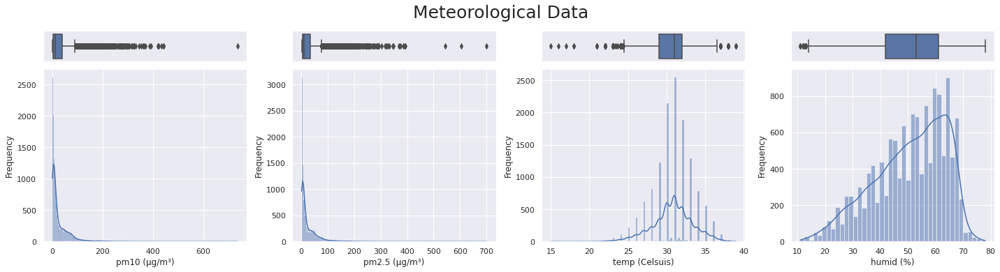

In [ ]:
colName = weather.columns
units = ['µg/m³', 'µg/m³', 'Celsuis', '%']

fig, (ax_box, ax_hist) = plt.subplots(2,4, gridspec_kw={"height_ratios": (.15, .85)}, figsize=(20,5))
for i in range(4):
  sns.boxplot(data=weather, x=colName[i], ax=ax_box[i])
  sns.histplot(data=weather, x=colName[i], ax=ax_hist[i], kde=True)
  ax_box[i].get_xaxis().set_visible(False)
  ax_hist[i].set_ylabel('Frequency')
  ax_hist[i].set_xlabel('{} ({})'.format(colName[i], units[i]))

fig.tight_layout()
fig.suptitle('Meteorological Data', y=1.075, size=25) 
plt.show()

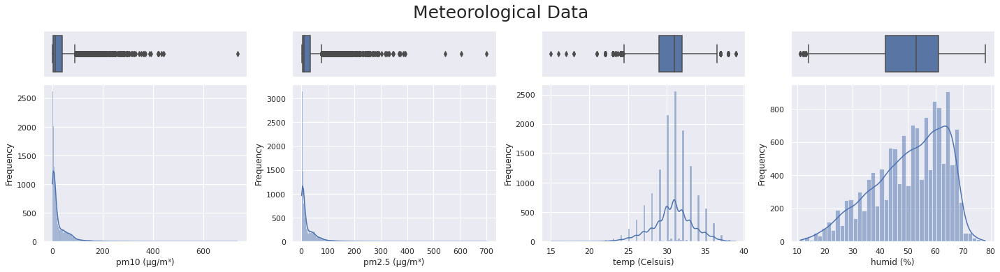

In [ ]:
colName = weather.columns
units = ['µg/m³', 'µg/m³', 'Celsuis', '%']

fig, (ax_box, ax_hist) = plt.subplots(2,4, gridspec_kw={"height_ratios": (.225, .775)}, figsize=(20,5))
for i in range(4):
  sns.boxplot(data=weather, x=colName[i], ax=ax_box[i])
  sns.histplot(data=weather, x=colName[i], ax=ax_hist[i], kde=True)
  ax_box[i].get_xaxis().set_visible(False)
  ax_hist[i].set_ylabel('Frequency')
  ax_hist[i].set_xlabel('{} ({})'.format(colName[i], units[i]))

fig.tight_layout()
fig.suptitle('Meteorological Data', y=1.075, size=25) 
plt.show()

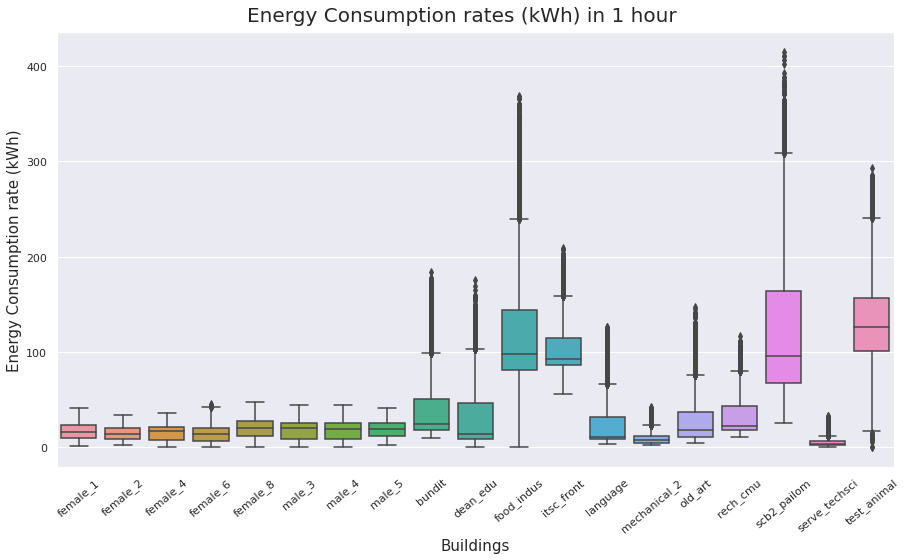

In [ ]:
boxplot_df = pd.melt(meters)
colName = boxplot_df.variable.unique()

fig, ax = plt.subplots(1,1,figsize=(15,8))
ax = sns.boxplot(x="variable", y="value", data=boxplot_df)
ax.set_ylabel('Energy Consumption rate (kWh)', size=15)
ax.set_xlabel('Buildings', size=15)
ax.set_xticklabels(colName, rotation=40)
fig.suptitle('Energy Consumption rates (kWh) in 1 hour', y=0.925, size=20)
plt.show()

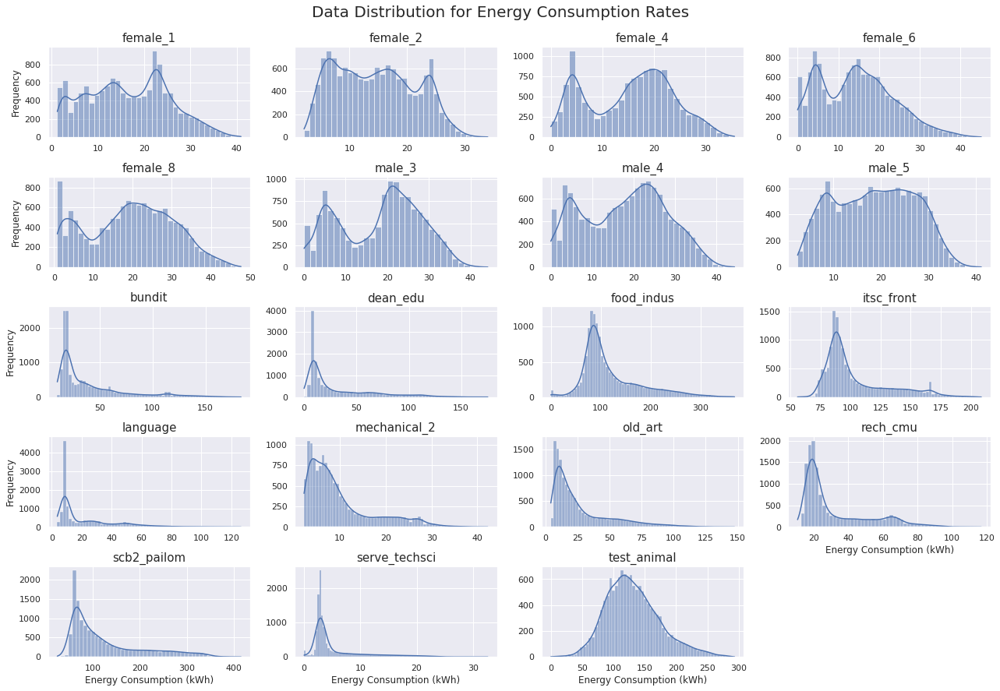

In [ ]:
buildingName = meters.columns
fig, axes = plt.subplots(5,4, figsize=(18,12))
name=0
for i in range(5):
  for j in range(4):
    if name != 19:
      sns.histplot(data=meters, x=buildingName[name], kde=True, ax=axes[i,j])
      axes[i,j].set_title(buildingName[name], size=15)
      axes[i,j].set(xlabel=None, ylabel=None)
      axes[3,3].set_xlabel('Energy Consumption (kWh)')
      for k in range(3):
        axes[4,k].set_xlabel('Energy Consumption (kWh)')
      for l in range(4):
        axes[l,0].set_ylabel('Frequency')
    else: pass
    name+=1
axes[4,3].axis('off') 
fig.tight_layout()
fig.suptitle('Data Distribution for Energy Consumption Rates', y=1.025, size=20)
plt.show()

In [ ]:
# ============================================== Heat Map ==============================================
def plot_heatmap(data=None, plot='elec', color1='YlOrBr', color2='Blues', title='Title'):
  month_name = ["Feb 2020", "Mar 2020", "Apr 2020", "May 2020", "Jun 2020", "July 2020", "Aug 2020", "Sept 2020", "Oct 2020",
                "Nov 2020", "Dec 2020", "Jan 2020", "Feb 2021", "Mar 2021", "Apr 2021", "May 2021", "Jun 2021", "July 2021", "Aug 2021"]
  df = pd.DataFrame(data).copy()
  name = df.columns[0]
  df['day'] = [i.day for i in df.index]
  df['month'] = [i.month for i in df.index]
  df['year'] = [i.year for i in df.index]
  df['day_of_week'] = [i.dayofweek for i in df.index]
  df['hour'] = [i.hour for i in df.index]
  df_pivot1 = pd.pivot_table(df, values=name, index=['year','month'] , columns=['day'], aggfunc=np.mean).round(2)
  df_pivot1.index = month_name
  df_pivot2 = pd.pivot_table(df, values=name, index=['day_of_week'] , columns=['hour'], aggfunc=np.mean).round(2)
  df_pivot2.index = ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat','Sun']

  if plot == 'weather':
    decimal = '.0f'
    figsize = (13,8)
  else:
    decimal = '.1f'
    figsize = (16,9)
    title = name
  fig, axes = plt.subplots(2, 1, figsize=figsize, gridspec_kw={"height_ratios": (.725, .275)})
  sns.heatmap(df_pivot1, cmap=color1, robust=True, fmt=decimal, cbar=False,
                annot=True, linewidths=.5, annot_kws={'size':11}, ax=axes[0])
  sns.heatmap(df_pivot2, cmap=color2, robust=True, fmt=decimal, cbar=False,
                annot=True, linewidths=.5, annot_kws={'size':11}, ax=axes[1])
  axes[0].set_title('​Average in each day in each month', size=15)
  axes[0].set_xlabel('​Day')
  axes[1].set_title('Average in each hour in a week', size=15)
  axes[1].set_xlabel('Hour')
  fig.tight_layout()
  fig.suptitle(title, y=1.035, x=0.52, size=30)
  plt.show()
# =====================================================================================================

# ============================================== Line Plots ==============================================
def line_plot(data, window, color, seasonal, y_text, ylabel, title):
  name = data.columns[0]
  fig, axes = plt.subplots(1, 1, figsize=(25,8))
  if len(data.columns) > 1 :
    df_rolling = data.rolling(window).mean().reset_index()
    df_rolling = pd.melt(df_rolling, id_vars='Time')
    sns.lineplot(data=df_rolling, x='Time', y='value', hue='variable', palette = color, linewidth=2.5)

  else:
    df_rolling = data.rolling(window).mean().reset_index()
    sns.lineplot(data=df_rolling, x='Time', y=name, color=color, linewidth=2.5)

  if seasonal == 'season':
    
    date = [[dt.datetime(2020, 3, 1), dt.datetime(2020, 3, 3), 'Summer'],
          [dt.datetime(2020, 7, 1), dt.datetime(2020, 7, 3), 'Raining'],
          [dt.datetime(2020, 11, 1), dt.datetime(2020, 11, 3), 'Winter'],
          [dt.datetime(2021, 3, 1), dt.datetime(2021, 3, 3), 'Summer'],
          [dt.datetime(2021, 7, 1), dt.datetime(2021, 7, 3), 'Raining']]
    rotation=90
  else:
    date = [[dt.datetime(2020, 5, 4), dt.datetime(2020, 5, 7), 'Ending\n2nd 2019 Semester'],
          [dt.datetime(2020, 7, 8), dt.datetime(2020, 7, 11), 'Starting\n1st 2020 Semester'],
          [dt.datetime(2020, 11, 23), dt.datetime(2020, 11, 26), 'Starting\n2nd 2020 Semester'],
          [dt.datetime(2021, 4, 5), dt.datetime(2021, 4, 8), 'Ending\n2nd 2020 Semester'],
          [dt.datetime(2021, 6, 21), dt.datetime(2021, 6, 24), 'Starting\n1st 2021 Semester']]
    rotation=0

  for i in range(5):
    plt.axvline(date[i][0], linestyle='--', color='black')
    plt.text(date[i][1],y_text,date[i][2],rotation=rotation, size=12,color='black')

  plt.xticks(fontsize=13)
  plt.yticks(fontsize=13)
  axes.set_xlabel('Time', size=18)
  axes.set_ylabel(ylabel, size=18)
  axes.set_title(title, size=25)
  fig.tight_layout()
  plt.show()

def line_plot_elec(data, window, color, y_text, ylim):
  name = data.columns[0]
  fig, axes = plt.subplots(2,1, figsize=(20,10))
  # if len(data.columns) > 1 :
  #   df_rolling = data.rolling(window).mean().reset_index()
  #   df_rolling = pd.melt(df_rolling, id_vars='Time')
  #   sns.lineplot(data=df_rolling, x='Time', y='value', hue='variable', palette = color, linewidth=2.5)

  # else:
  df_rolling = data.rolling(window).mean().reset_index()
  sns.lineplot(data=df_rolling, x='Time', y=name, color=color, linewidth=2.5, ax=axes[0])
  sns.lineplot(data=df_rolling, x='Time', y=name, color=color, linewidth=2.5, ax=axes[1])

  axes[0].set_ylim(bottom=None, top=ylim)
  axes[1].set_ylim(bottom=None, top=ylim)


  date_season = [[dt.datetime(2020, 3, 1), dt.datetime(2020, 3, 3), 'Summer'],
        [dt.datetime(2020, 7, 1), dt.datetime(2020, 7, 3), 'Raining'],
        [dt.datetime(2020, 11, 1), dt.datetime(2020, 11, 3), 'Winter'],
        [dt.datetime(2021, 3, 1), dt.datetime(2021, 3, 3), 'Summer'],
        [dt.datetime(2021, 7, 1), dt.datetime(2021, 7, 3), 'Raining']]
  date_semester = [[dt.datetime(2020, 5, 4), dt.datetime(2020, 5, 7), 'Ending\n2nd 2019 Semester'],
                  [dt.datetime(2020, 7, 8), dt.datetime(2020, 7, 11), 'Starting\n1st 2020 Semester'],
                   [dt.datetime(2020, 11, 16), dt.datetime(2020, 10, 1), 'Ending\n2nd 2020 Semester']
                  [dt.datetime(2020, 11, 23), dt.datetime(2020, 11, 26), 'Starting\n2nd 2020 Semester'],
                  [dt.datetime(2021, 4, 5), dt.datetime(2021, 4, 8), 'Ending\n2nd 2020 Semester'],
                  [dt.datetime(2021, 6, 21), dt.datetime(2021, 6, 24), 'Starting\n1st 2021 Semester']]

  for i in range(5):
    axes[0].axvline(date_season[i][0], linestyle='--', color='black')
    axes[0].text(date_season[i][1],y_text,date_season[i][2],rotation=0, size=12, color='black')
    axes[1].axvline(date_semester[i][0], linestyle='--', color='black')
    axes[1].text(date_semester[i][1],y_text,date_semester[i][2],rotation=0, size=12, color='black')


  axes[0].xaxis.set_tick_params(labelsize=13)
  axes[0].yaxis.set_tick_params(labelsize=13)
  axes[1].xaxis.set_tick_params(labelsize=13)
  axes[1].yaxis.set_tick_params(labelsize=13)
  axes[0].set_xlabel('Time', size=18)
  axes[0].set_ylabel('kWh', size=18)
  axes[0].set_title(name + ' (seasons)', size=25)
  axes[1].set_xlabel('Time', size=18)
  axes[1].set_ylabel('kWh', size=18)
  axes[1].set_title(name + ' (semester)', size=25)
  fig.tight_layout()
  plt.show()

# Weather plot by Line Plots 

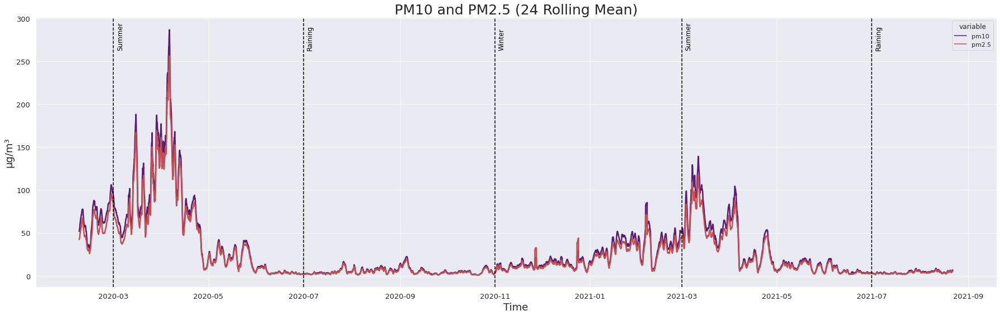

In [ ]:
line_plot(data=weather[['pm10', 'pm2.5']], window=24, color=[sns.color_palette('dark')[4], sns.color_palette()[3]],
          seasonal='season', y_text=265, ylabel='µg/m³', title='PM10 and PM2.5 (24 Rolling Mean)')

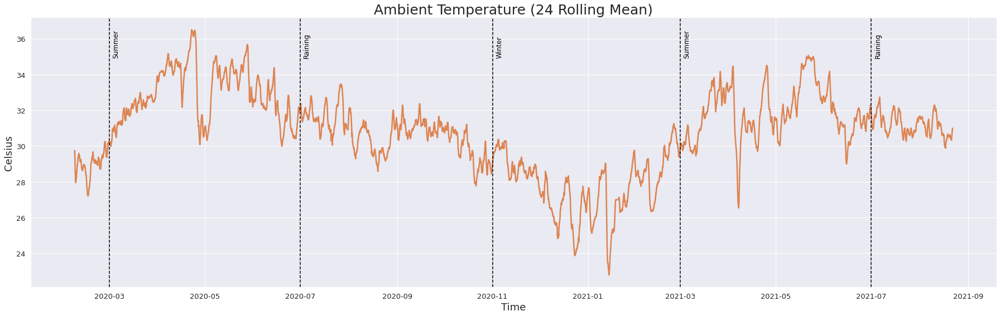

In [ ]:
line_plot(data=weather[['temp']], window=24, color=sns.color_palette()[1],
          seasonal='season', y_text=35, ylabel='Celsius', title='Ambient Temperature (24 Rolling Mean)')

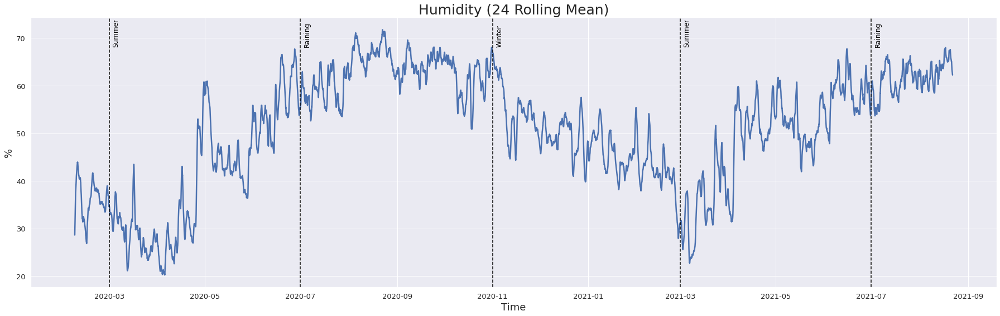

In [ ]:
line_plot(data=weather[['humid']], window=24, color=sns.color_palette('deep')[0],
          seasonal='season', y_text=68.5, ylabel='%', title='Humidity (24 Rolling Mean)')

# Smart meter plot by Line Plots

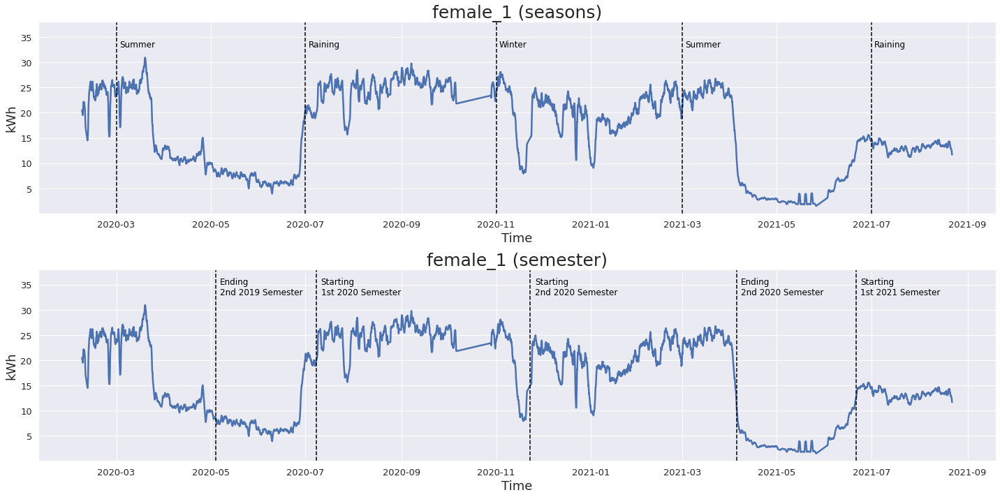

In [ ]:
line_plot_elec(data=meters[['female_1']], window=24, color=sns.color_palette('deep')[0], y_text=33, ylim=38)

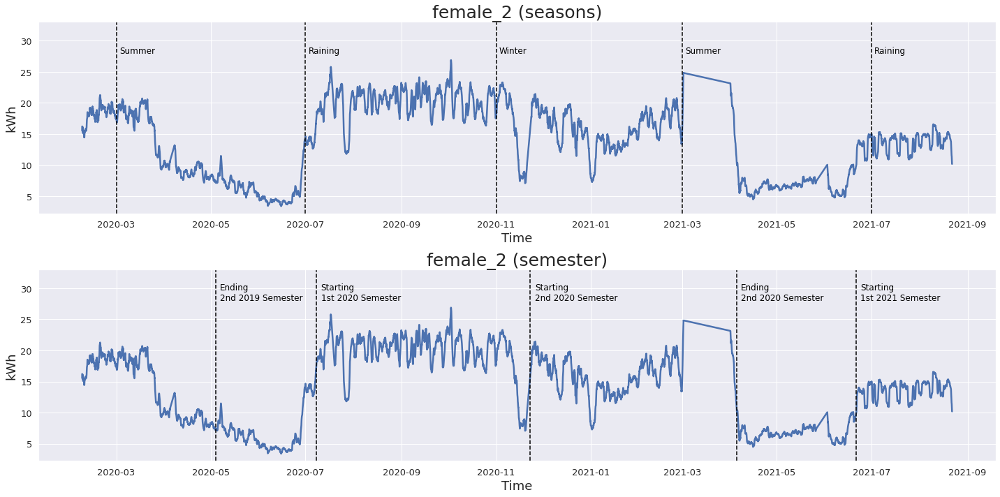

In [ ]:
line_plot_elec(data=meters[['female_2']], window=24, color=sns.color_palette('deep')[0], y_text=28, ylim=33)

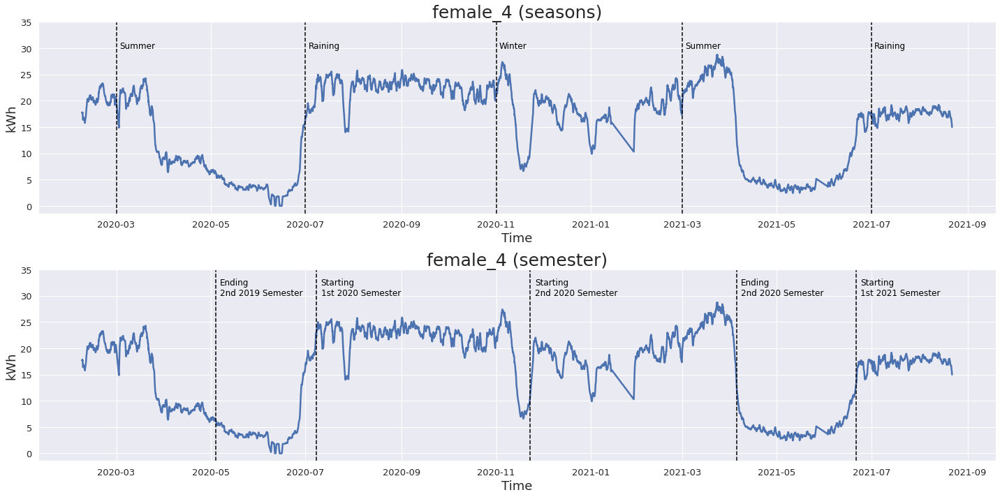

In [ ]:
line_plot_elec(data=meters[['female_4']], window=24, color=sns.color_palette('deep')[0], y_text=30, ylim=35)

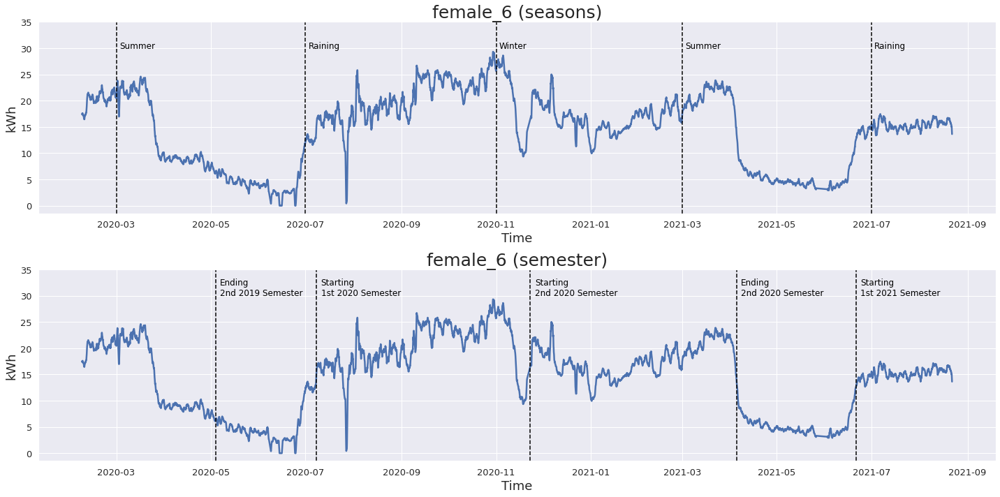

In [ ]:
line_plot_elec(data=meters[['female_6']], window=24, color=sns.color_palette('deep')[0], y_text=30, ylim=35)

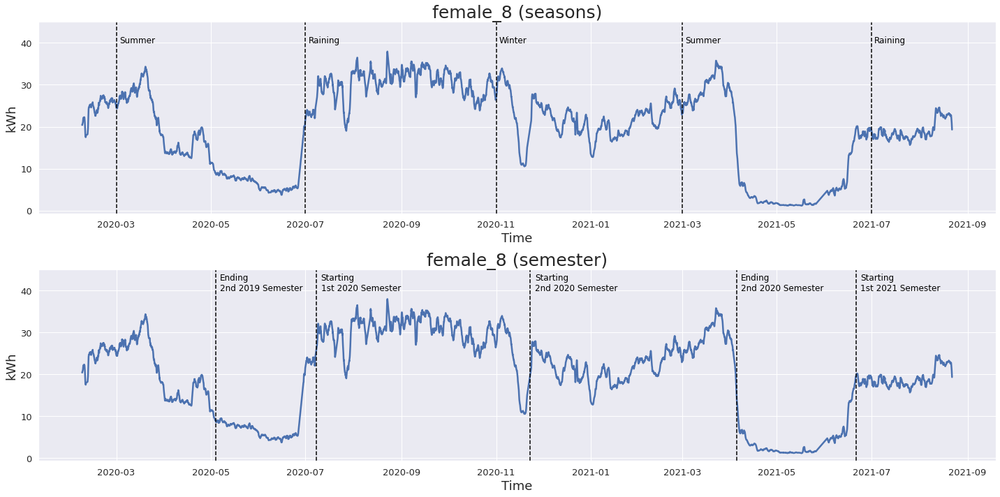

In [ ]:
line_plot_elec(data=meters[['female_8']], window=24, color=sns.color_palette('deep')[0], y_text=40, ylim=45)

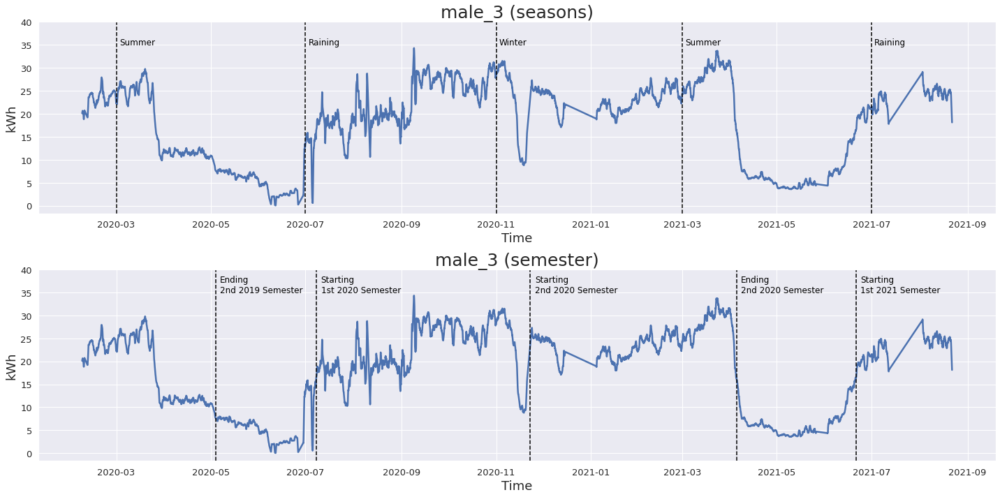

In [ ]:
line_plot_elec(data=meters[['male_3']], window=24, color=sns.color_palette('deep')[0], y_text=35, ylim=40)

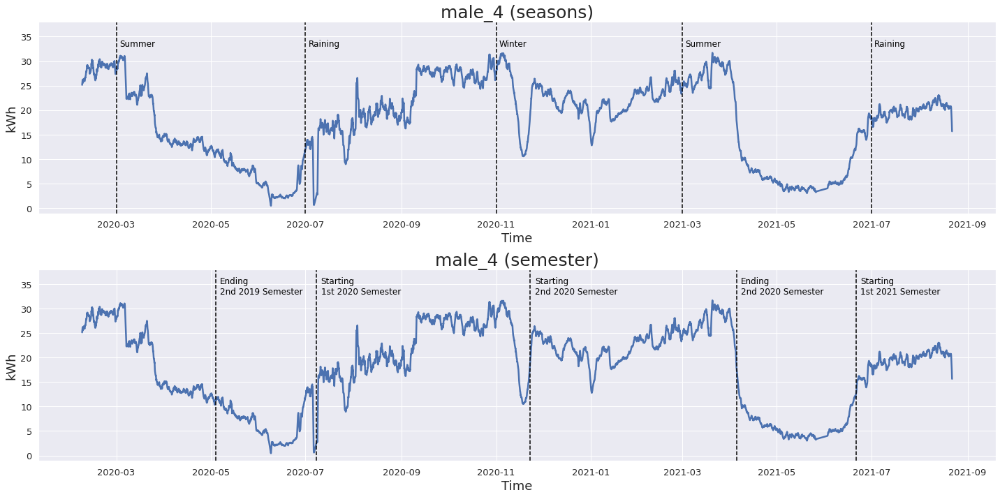

In [ ]:
line_plot_elec(data=meters[['male_4']], window=24, color=sns.color_palette('deep')[0], y_text=33, ylim=38)

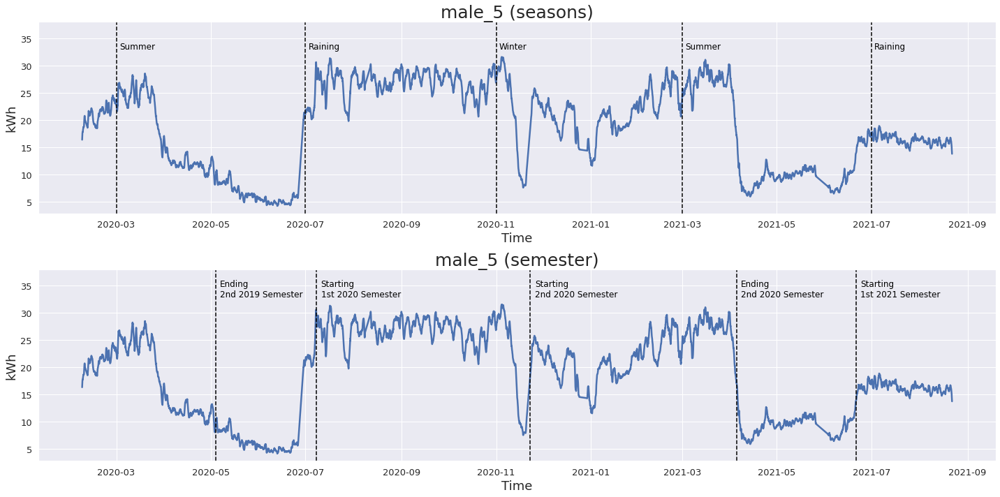

In [ ]:
line_plot_elec(data=meters[['male_5']], window=24, color=sns.color_palette('deep')[0], y_text=33, ylim=38)

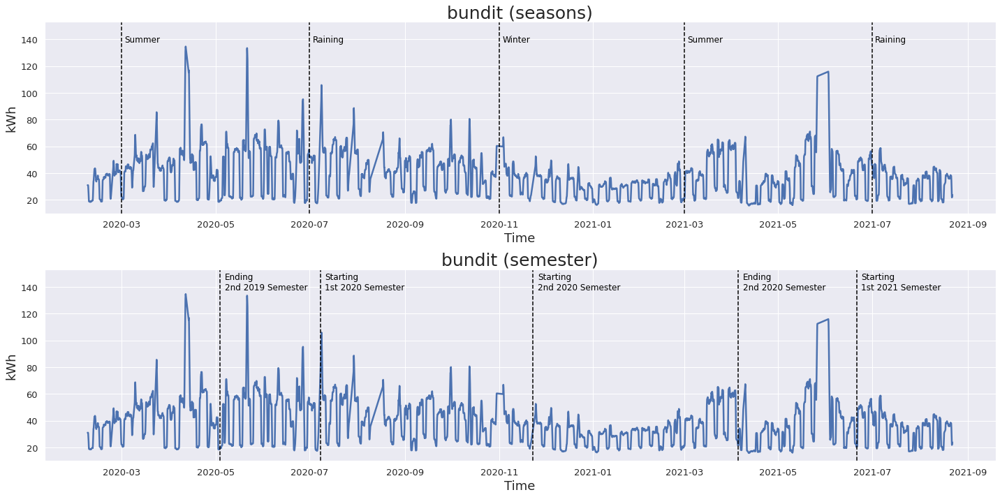

In [ ]:
line_plot_elec(data=meters[['bundit']], window=24, color=sns.color_palette('deep')[0], y_text=138, ylim=153)

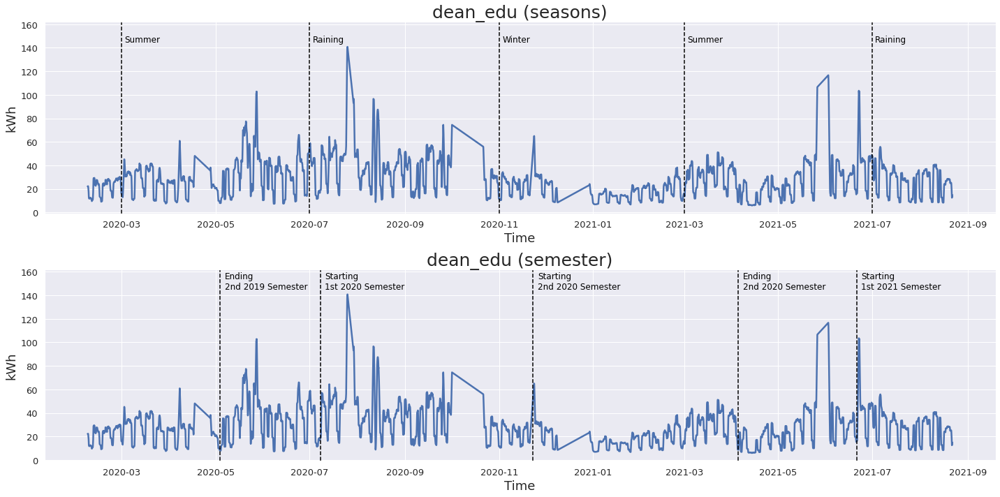

In [ ]:
line_plot_elec(data=meters[['dean_edu']], window=24, color=sns.color_palette('deep')[0], y_text=145, ylim=162)

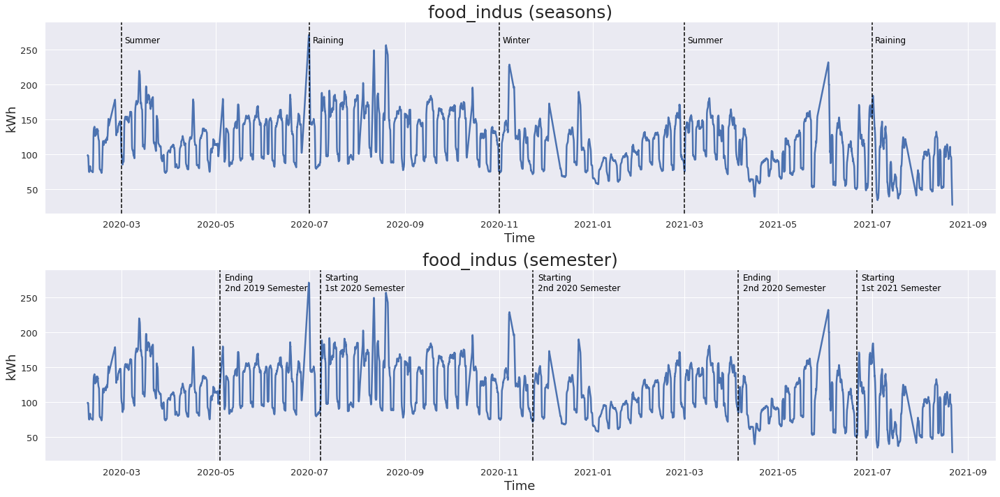

In [ ]:
line_plot_elec(data=meters[['food_indus']], window=24, color=sns.color_palette('deep')[0], y_text=260, ylim=290)

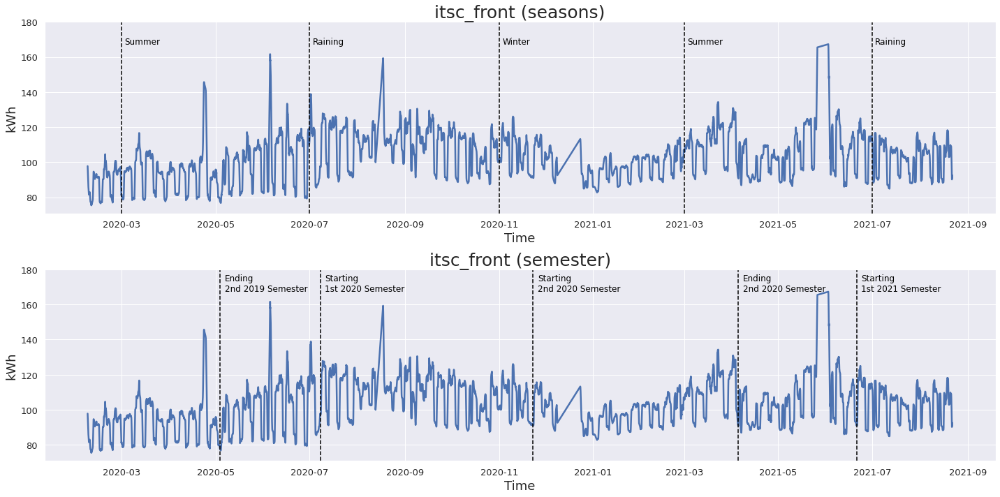

In [ ]:
line_plot_elec(data=meters[['itsc_front']], window=24, color=sns.color_palette('deep')[0], y_text=167.5, ylim=180)

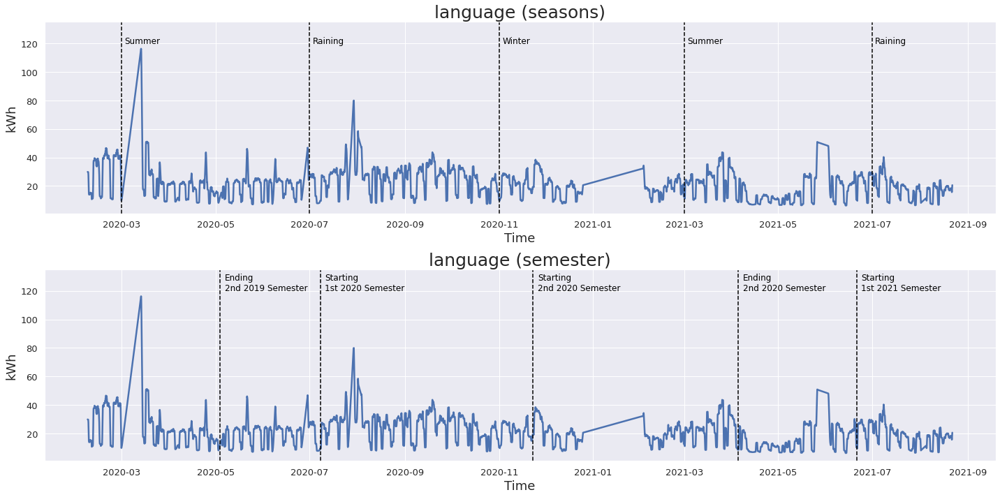

In [ ]:
line_plot_elec(data=meters[['language']], window=24, color=sns.color_palette('deep')[0], y_text=120, ylim=135)

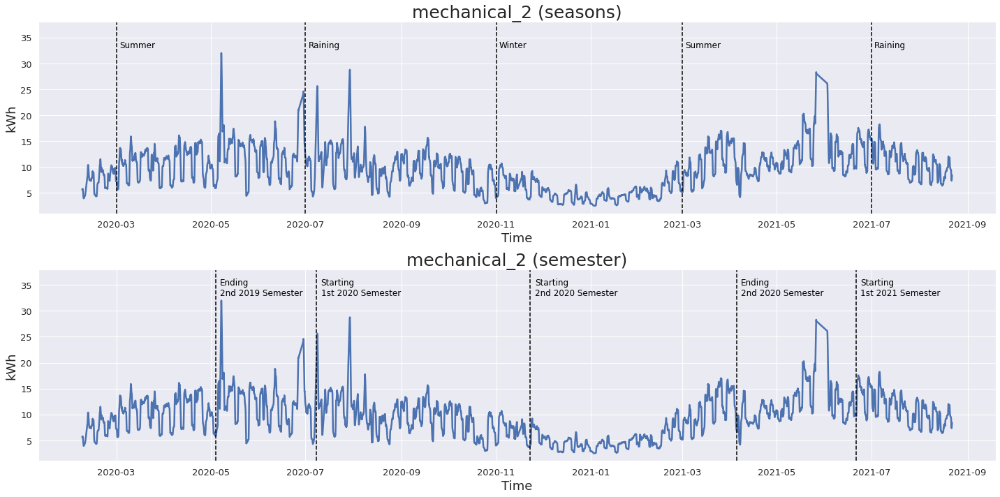

In [ ]:
line_plot_elec(data=meters[['mechanical_2']], window=24, color=sns.color_palette('deep')[0], y_text=33, ylim=38)

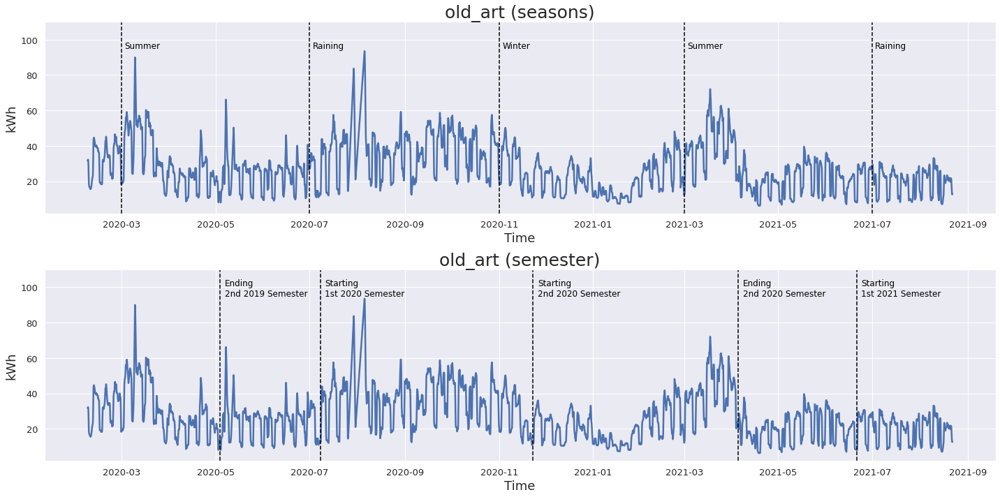

In [ ]:
line_plot_elec(data=meters[['old_art']], window=24, color=sns.color_palette('deep')[0], y_text=95, ylim=110)

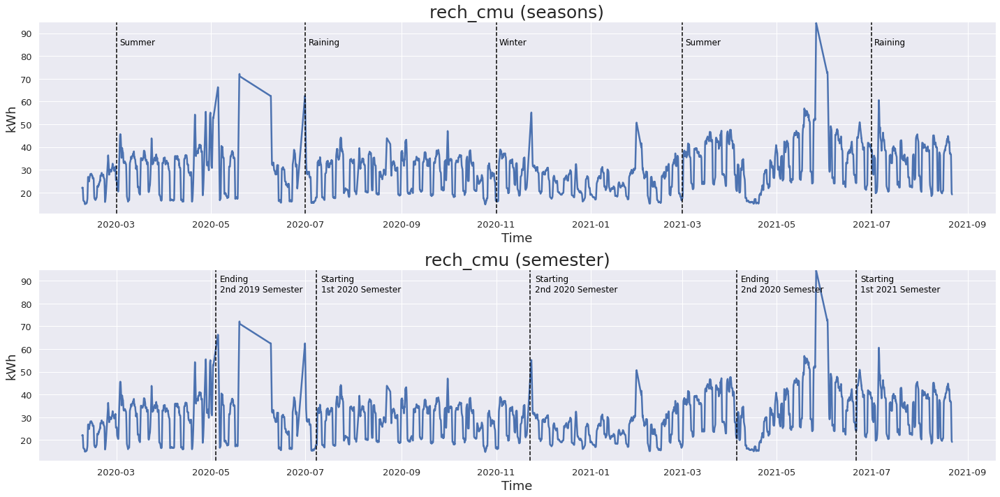

In [ ]:
line_plot_elec(data=meters[['rech_cmu']], window=24, color=sns.color_palette('deep')[0], y_text=85, ylim=95)

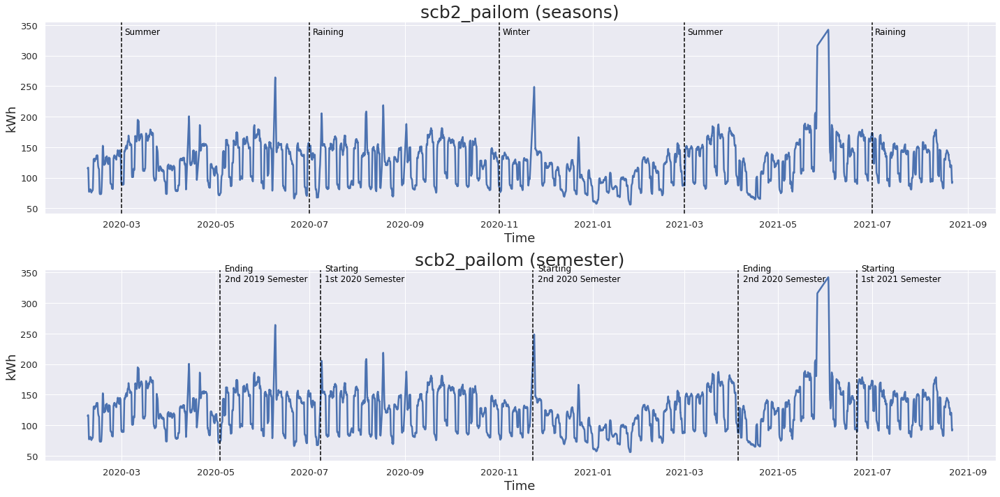

In [ ]:
line_plot_elec(data=meters[['scb2_pailom']], window=24, color=sns.color_palette('deep')[0], y_text=335, ylim=355)

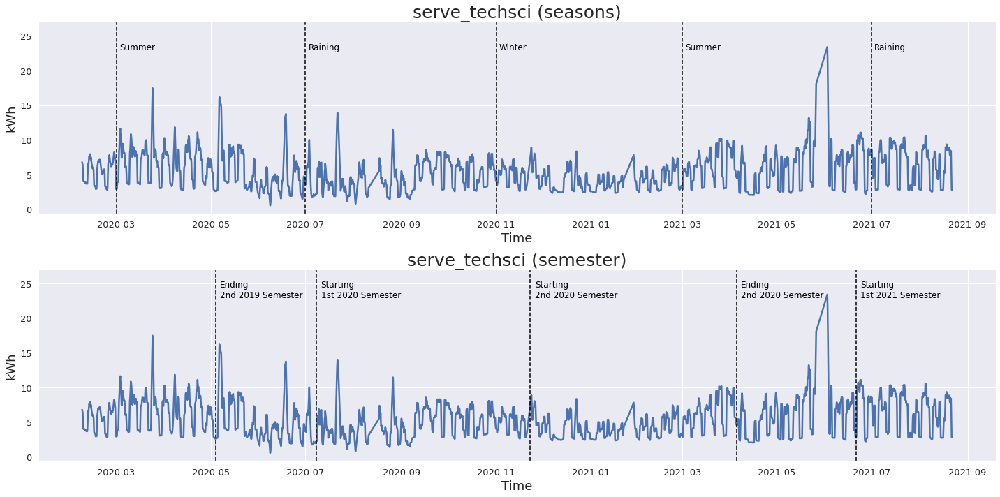

In [ ]:
line_plot_elec(data=meters[['serve_techsci']], window=24, color=sns.color_palette('deep')[0], y_text=23, ylim=27)

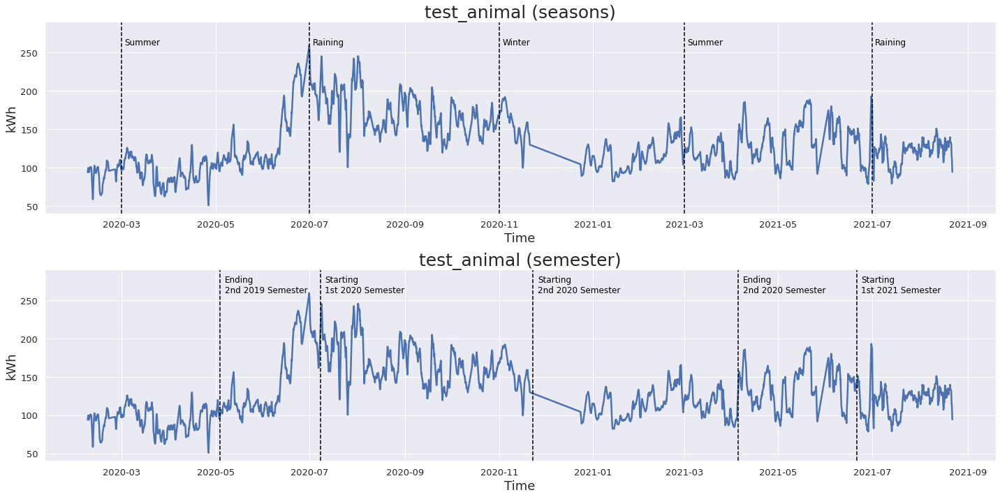

In [ ]:
line_plot_elec(data=meters[['test_animal']], window=24, color=sns.color_palette('deep')[0], y_text=260, ylim=290)

# Weather plot by 4 Heatmaps


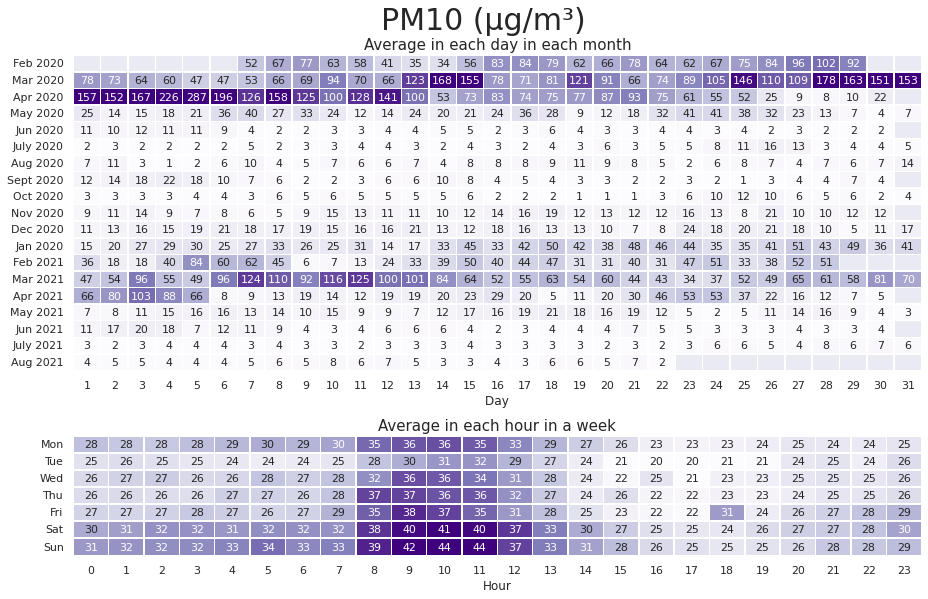

In [ ]:
plot_heatmap(datasets['pm10'], plot='weather', color1 = 'Purples', color2 = 'Purples', title='PM10 (µg/m³)')

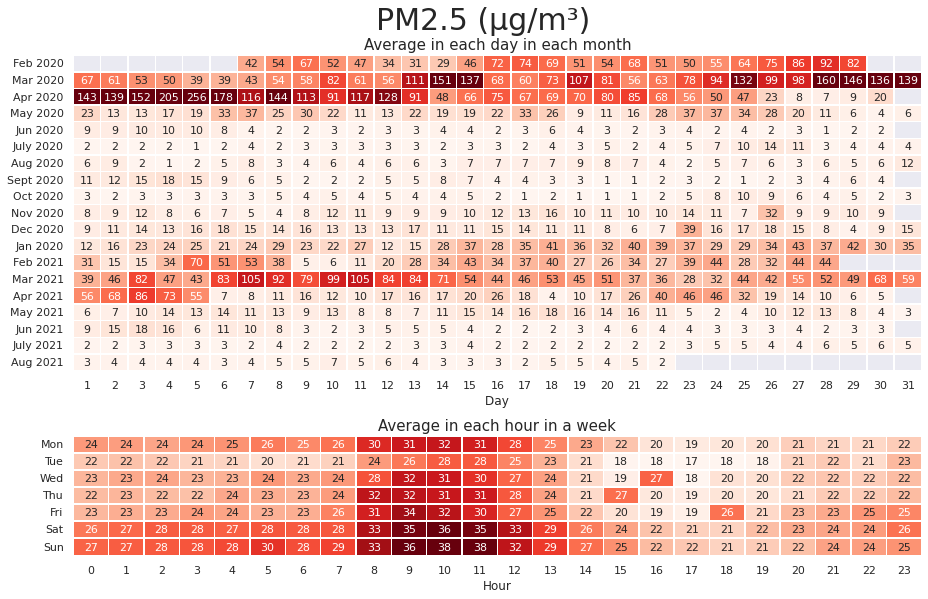

In [ ]:
plot_heatmap(datasets['pm2.5'], plot='weather',  color1 = 'Reds', color2 = 'Reds', title='PM2.5 (µg/m³)')

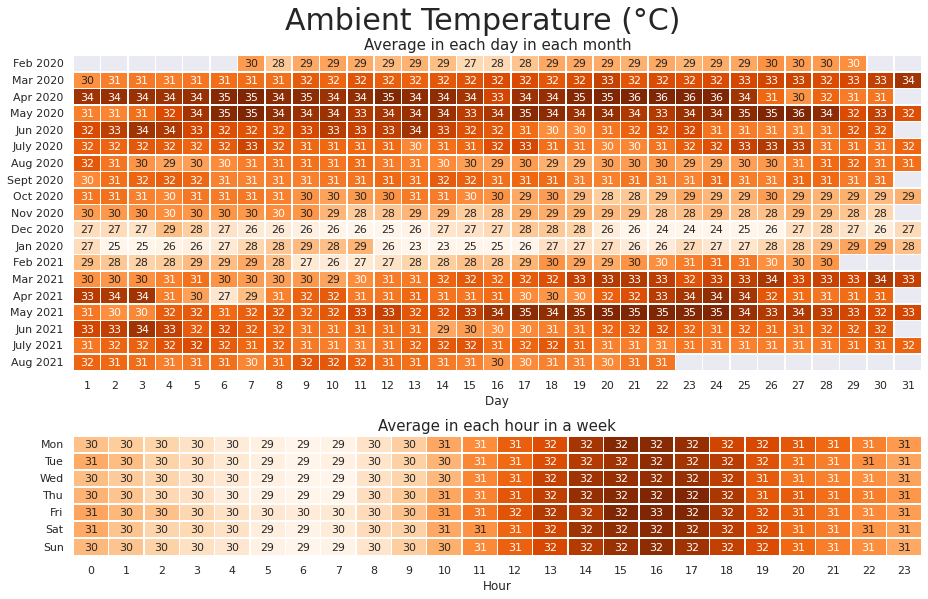

In [ ]:
plot_heatmap(datasets['temp'], plot='weather', color1 = 'Oranges', color2 = 'Oranges', title='Ambient Temperature (\u00B0C)')

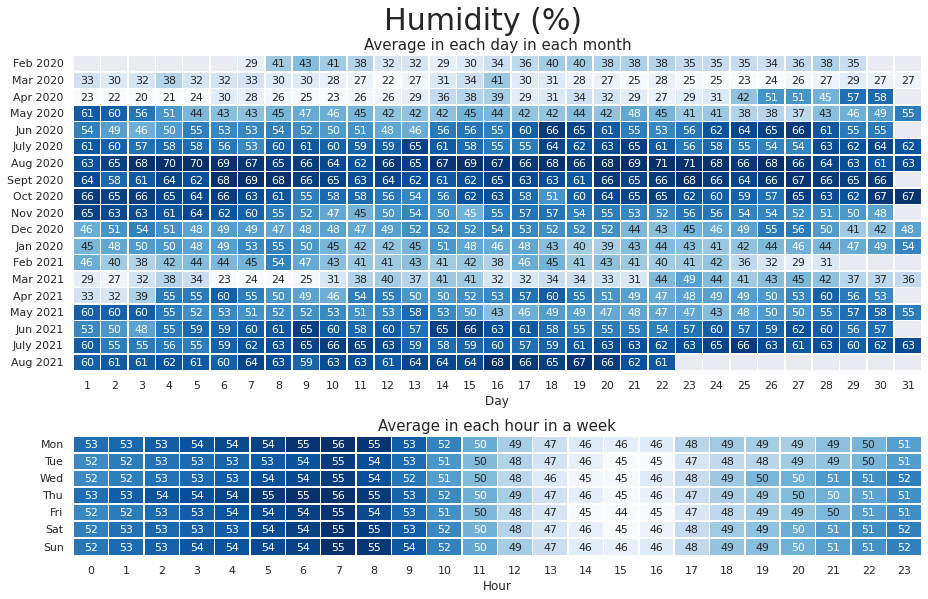

In [ ]:
plot_heatmap(datasets['humid'], plot='weather', color1 = 'Blues', color2 = 'Blues', title='Humidity (%)')

# Smart meter plot by 20 Heatmaps

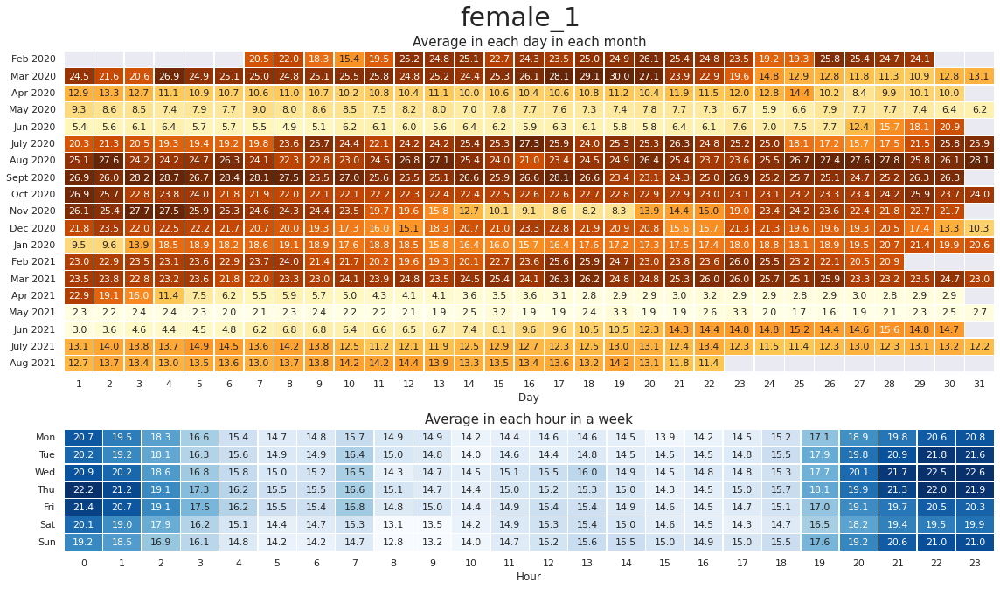

In [ ]:
plot_heatmap(datasets['female_1'], plot='meter')

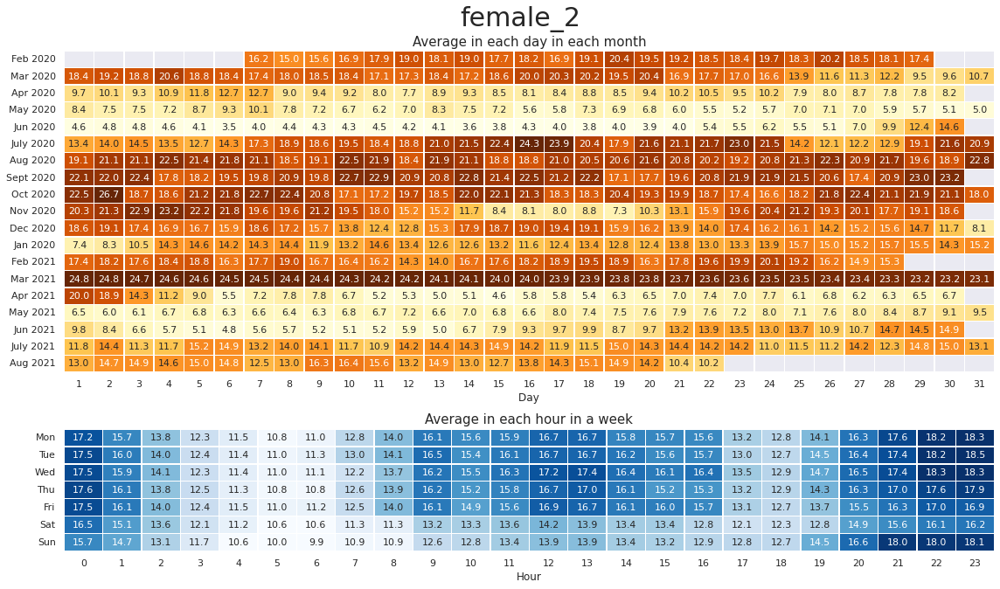

In [ ]:
plot_heatmap(datasets['female_2'], plot='meter')

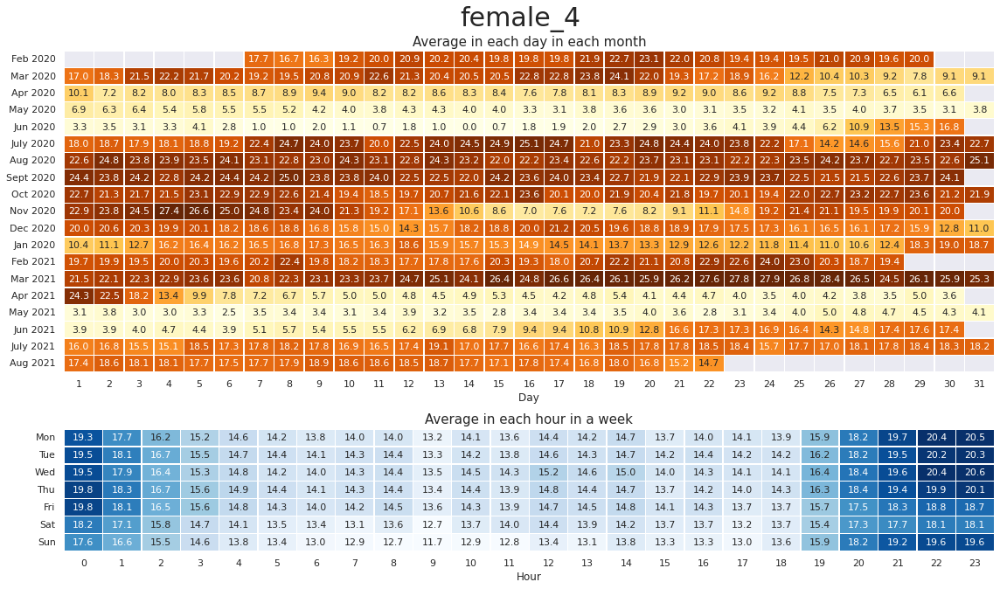

In [ ]:
plot_heatmap(datasets['female_4'], plot='meter')

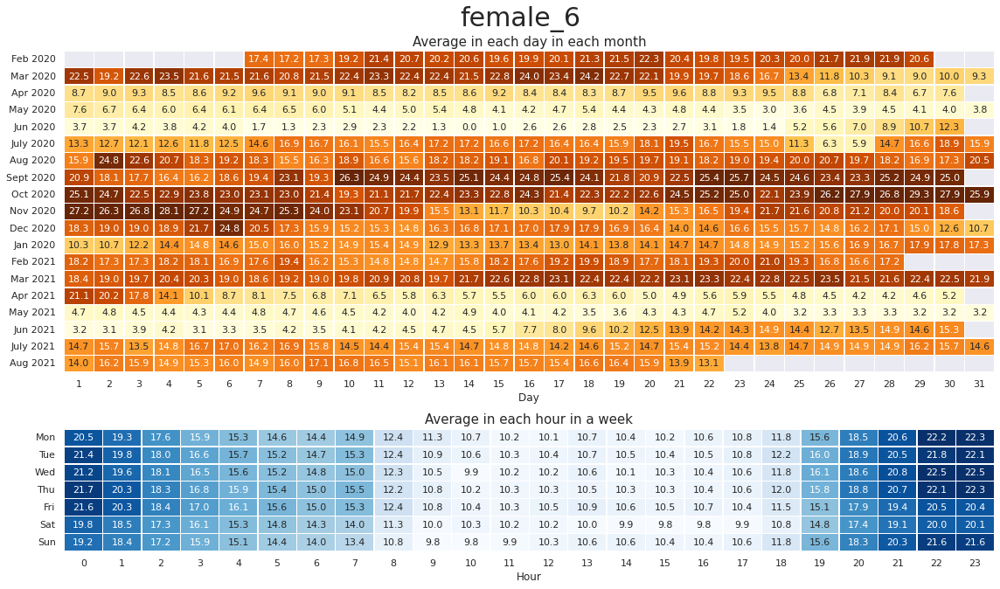

In [ ]:
plot_heatmap(datasets['female_6'], plot='meter')

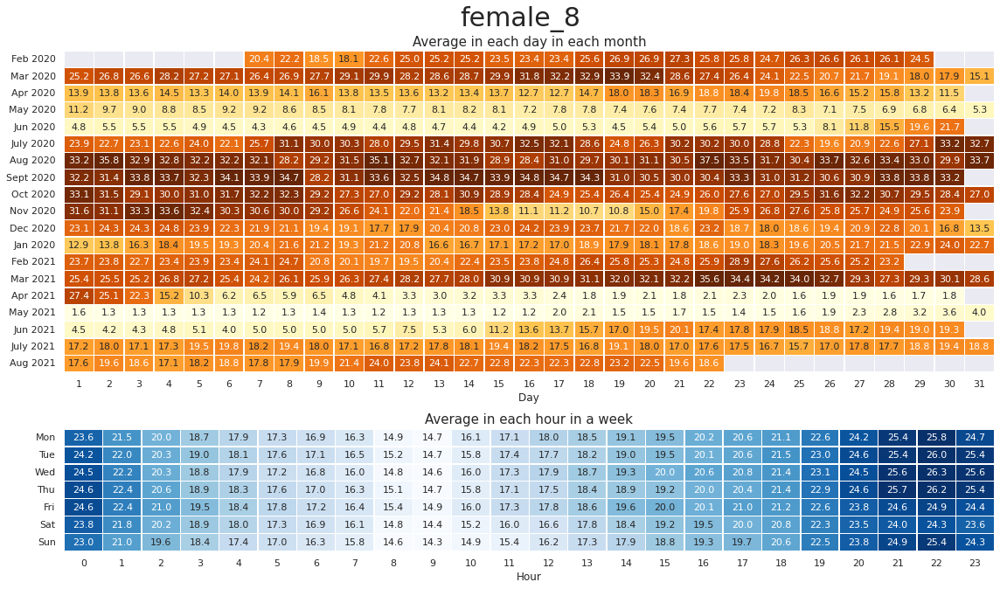

In [ ]:
plot_heatmap(datasets['female_8'], plot='meter')

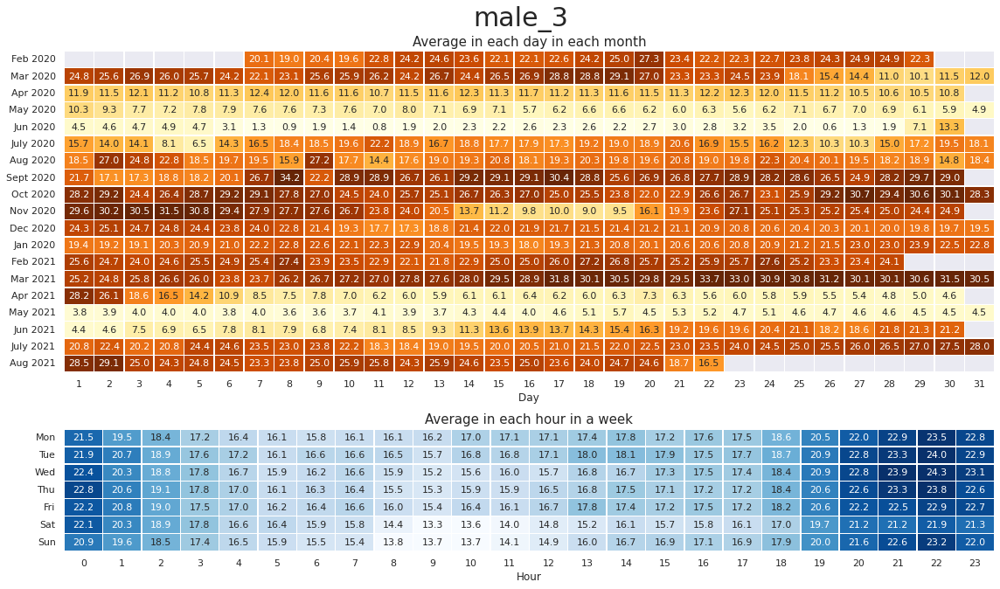

In [ ]:
plot_heatmap(datasets['male_3'], plot='meter')

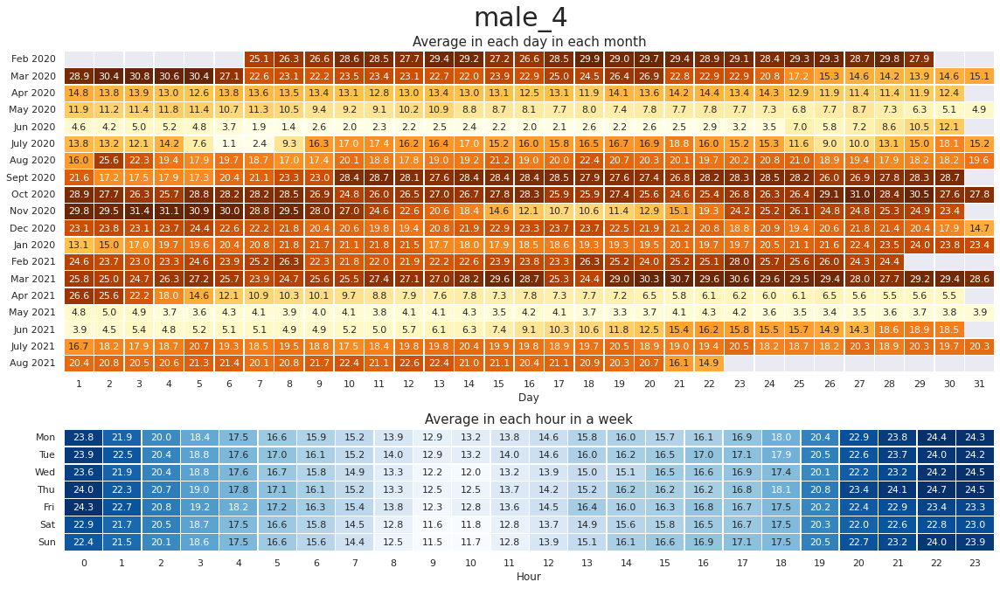

In [ ]:
plot_heatmap(datasets['male_4'], plot='meter')

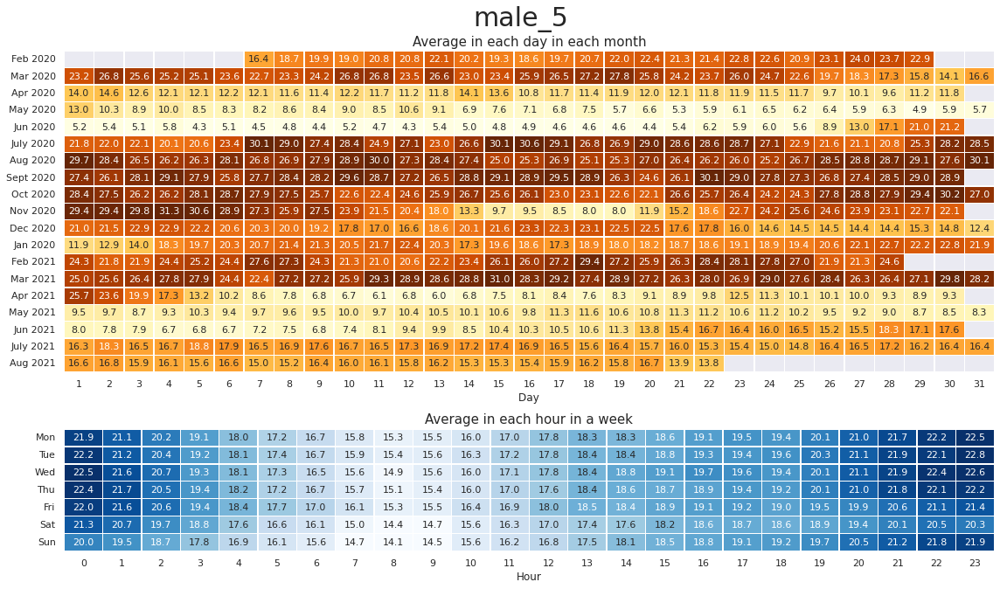

In [ ]:
plot_heatmap(datasets['male_5'], plot='meter')

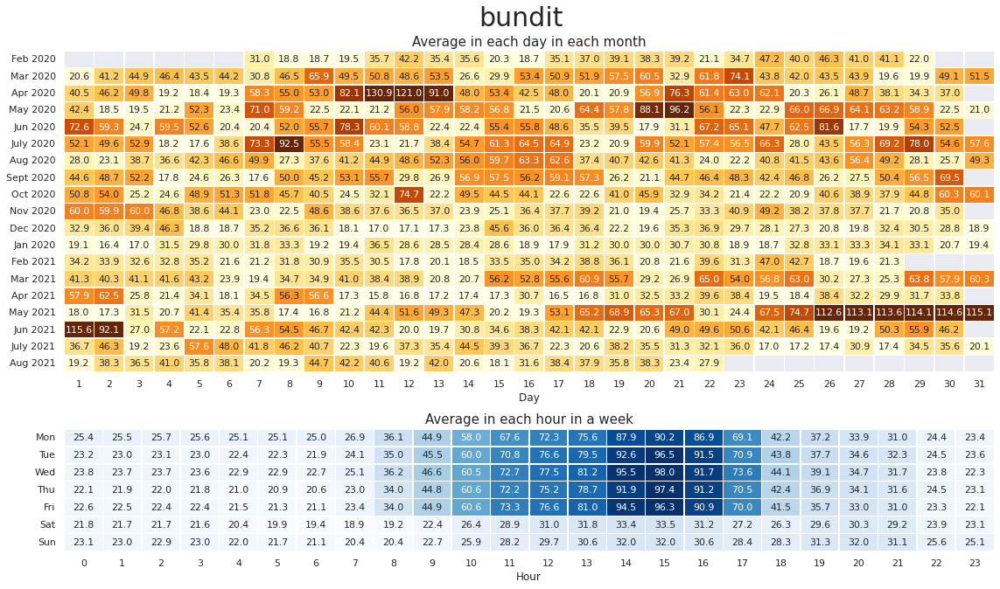

In [ ]:
plot_heatmap(datasets['bundit'], plot='meter')

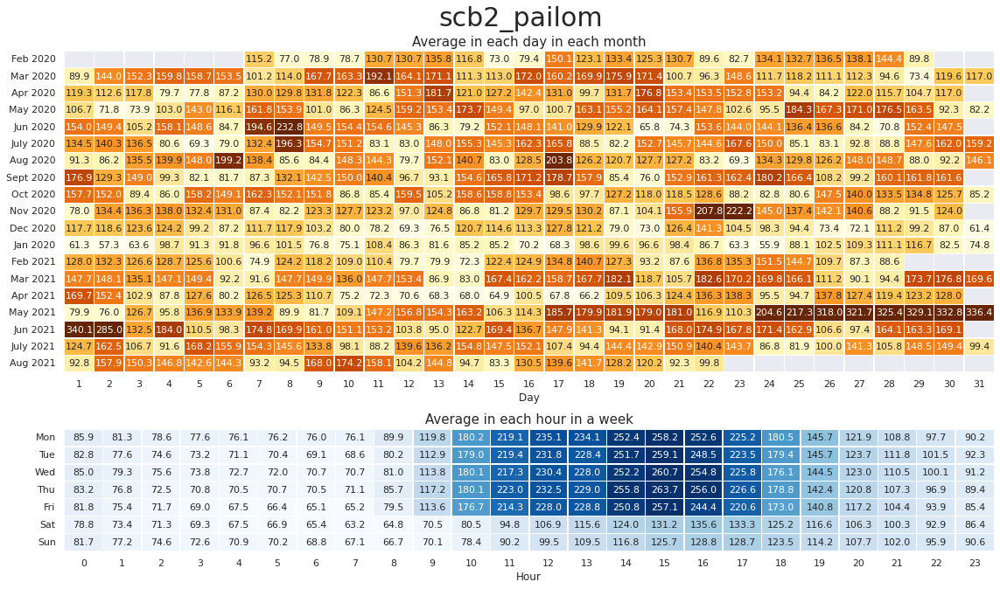

In [ ]:
plot_heatmap(datasets['scb2_pailom'], plot='meter')

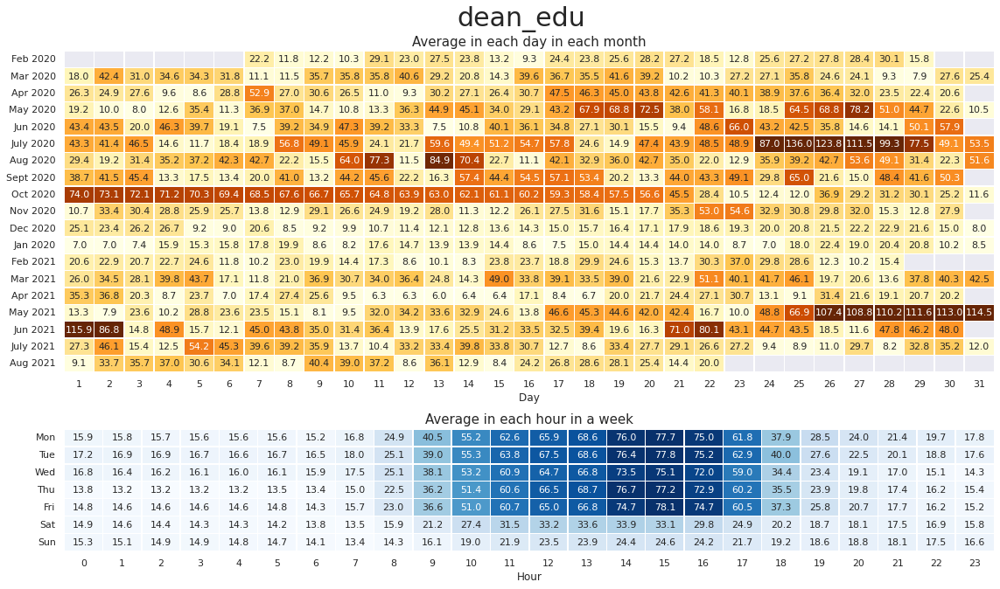

In [ ]:
plot_heatmap(datasets['dean_edu'], plot='meter')

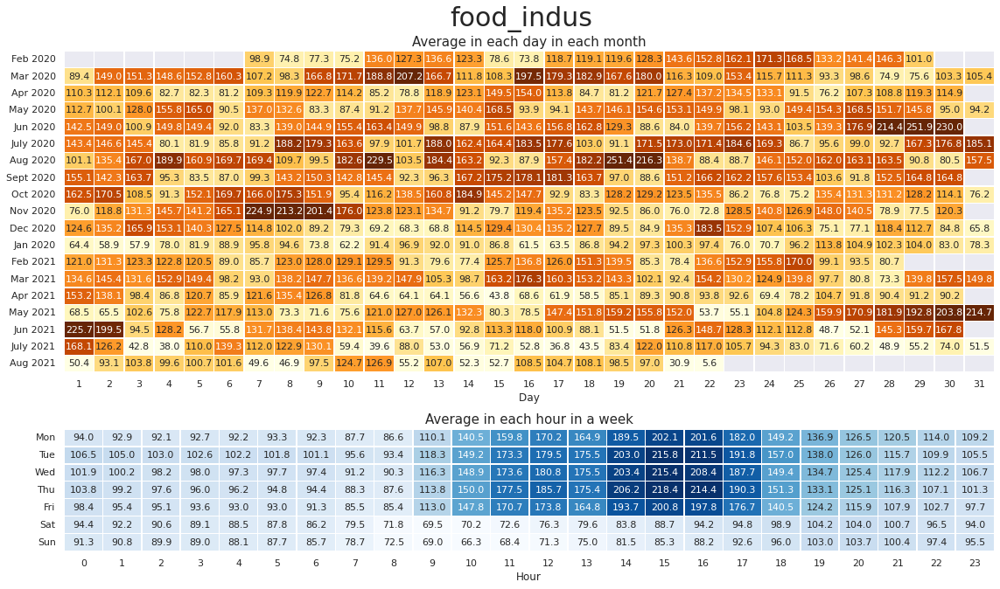

In [ ]:
plot_heatmap(datasets['food_indus'], plot='meter')

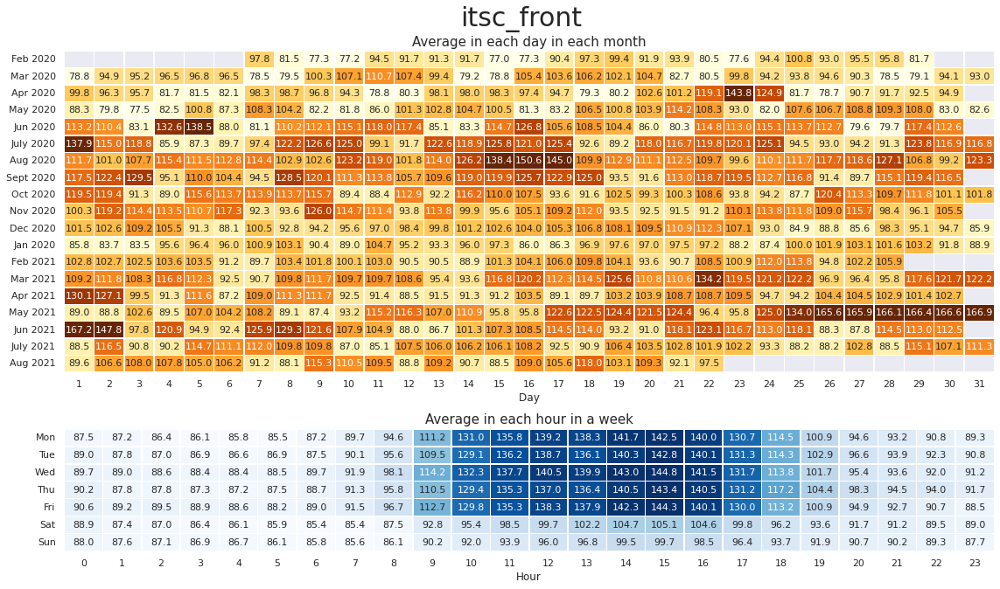

In [ ]:
plot_heatmap(datasets['itsc_front'], plot='meter')

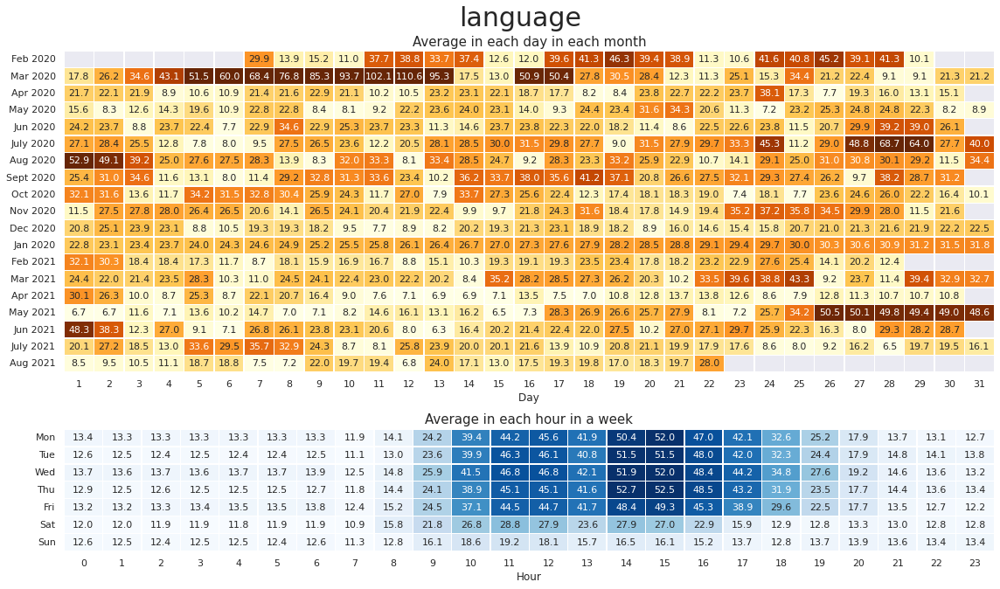

In [ ]:
plot_heatmap(datasets['language'], plot='meter')

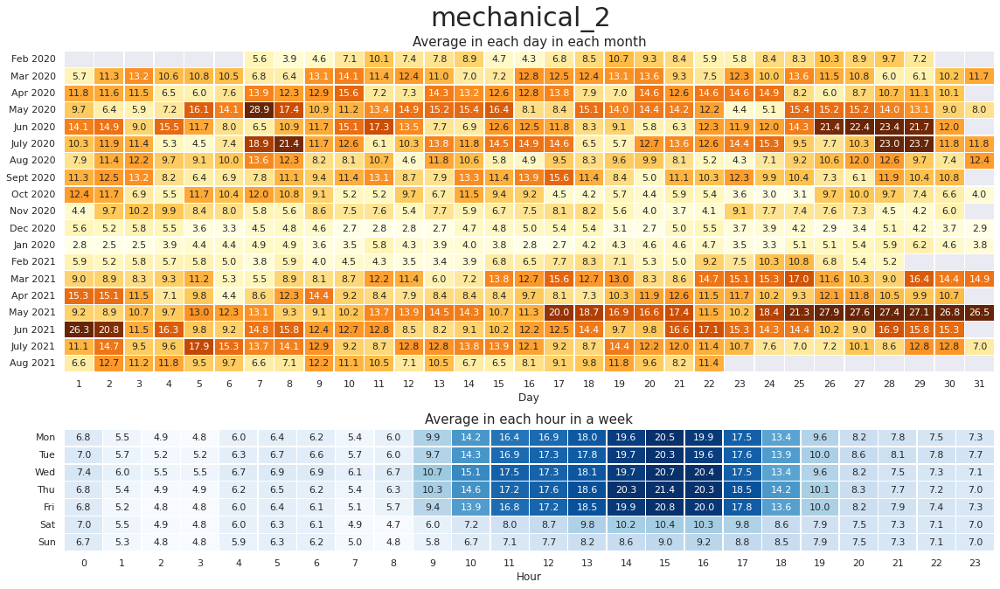

In [ ]:
plot_heatmap(datasets['mechanical_2'], plot='meter')

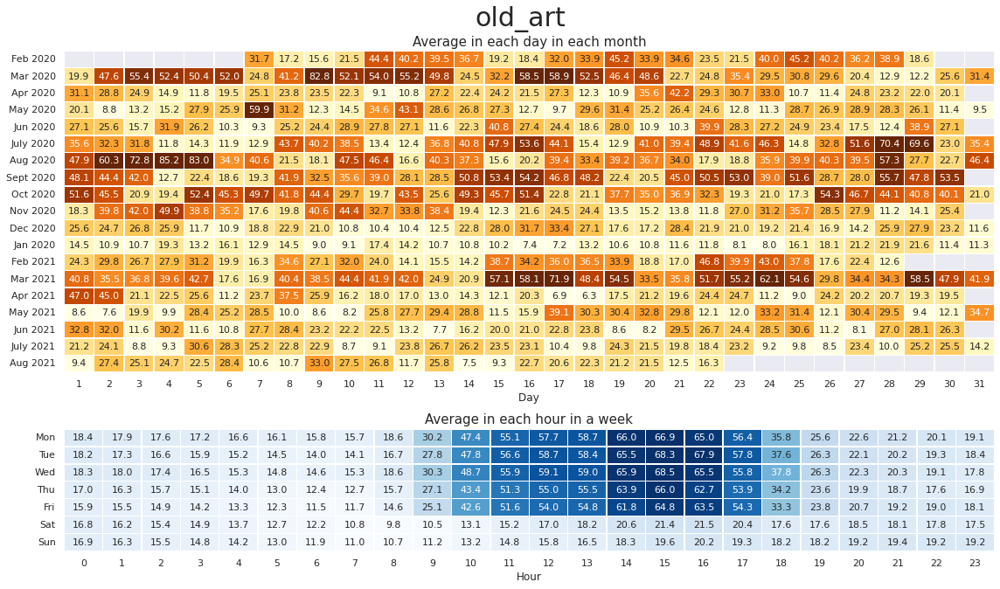

In [ ]:
plot_heatmap(datasets['old_art'], plot='meter')

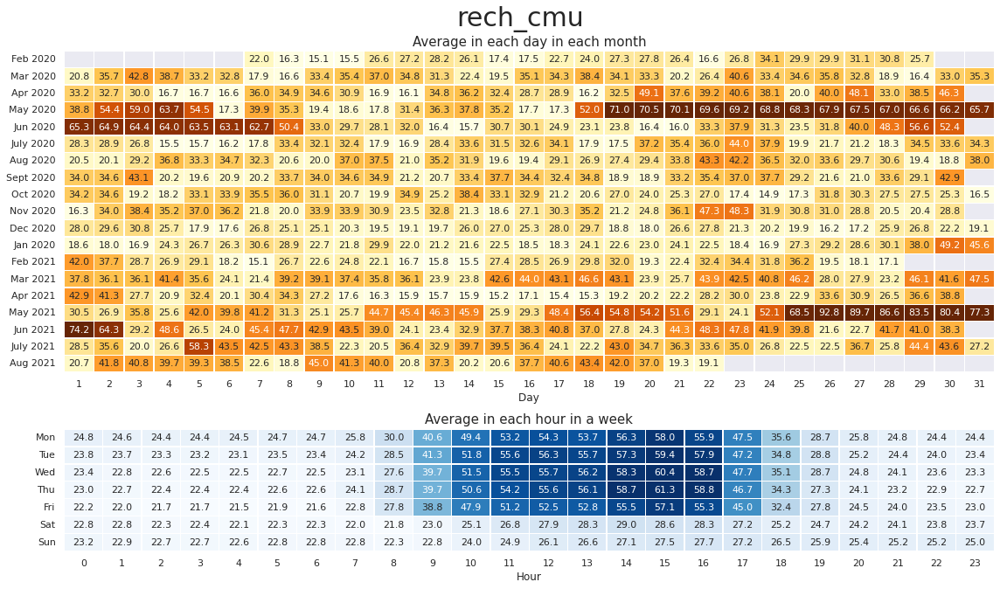

In [ ]:
plot_heatmap(datasets['rech_cmu'], plot='meter')

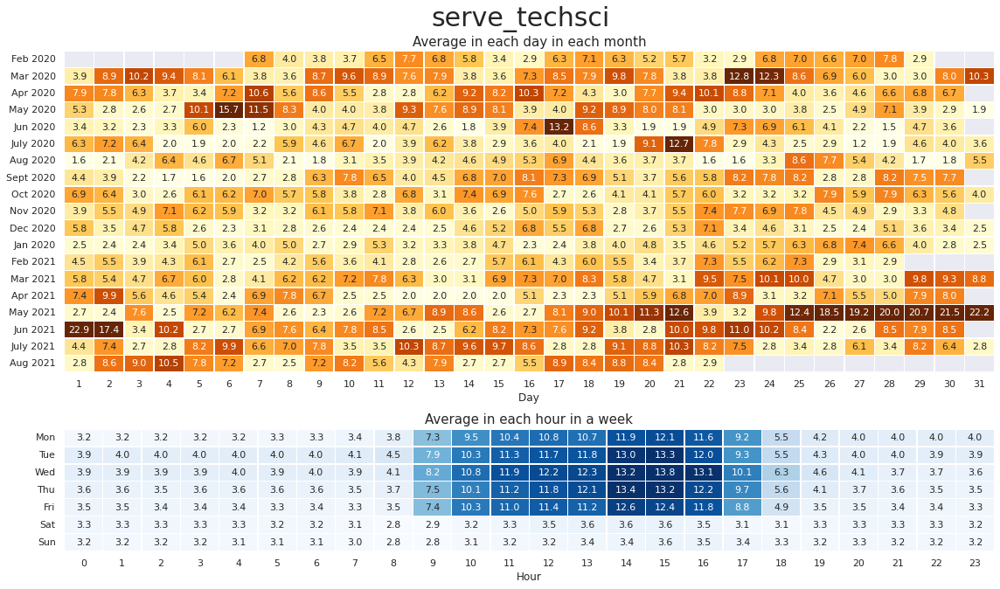

In [ ]:
plot_heatmap(datasets['serve_techsci'], plot='meter')

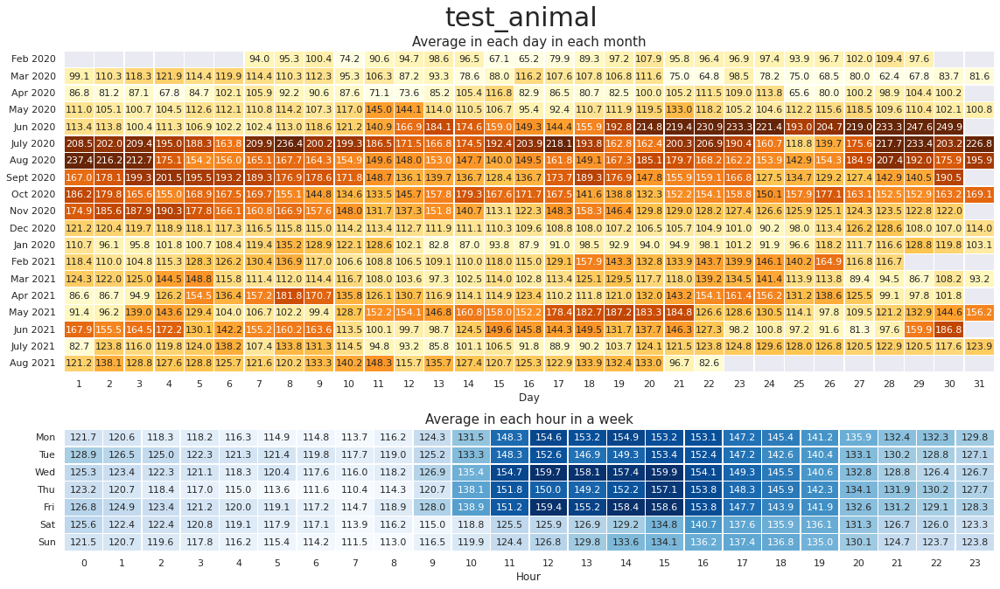

In [ ]:
plot_heatmap(datasets['test_animal'], plot='meter')

# Correlation
- self correlation(ACF, PACF)
- cross correlation (cross correlation, mutual information)

https://towardsdatascience.com/computing-cross-correlation-between-geophysical-time-series-488642be7bf0

https://medium.com/swlh/a-deep-conceptual-guide-to-mutual-information-a5021031fad0

### Correlation is Not Causation 
https://towardsdatascience.com/correlation-is-not-causation-ae05d03c1f53

## Pearson Correlation (Overall)

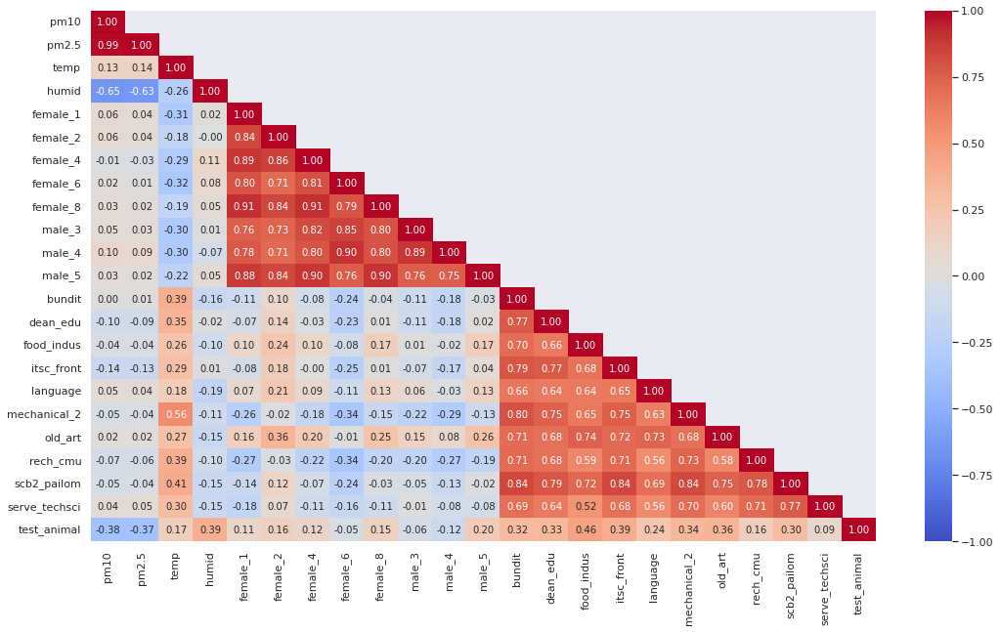

In [ ]:
corr_df = datasets.corr()
mask = np.triu(np.ones_like(corr_df), k=1)
plt.figure(figsize=(18,10))
ax = sns.heatmap(corr_df, vmin=-1, vmax=1,
                  cmap='coolwarm',mask=mask, fmt='.2f',annot=True)

# for text in ax.texts:
#     t = float(text.get_text())
#     if -0.1 < t < 0.1:
#         text.set_text('')
#     else:
#         text.set_text(round(t, 2))
plt.show()

## Pearson Correlation (Energy VS Weather)

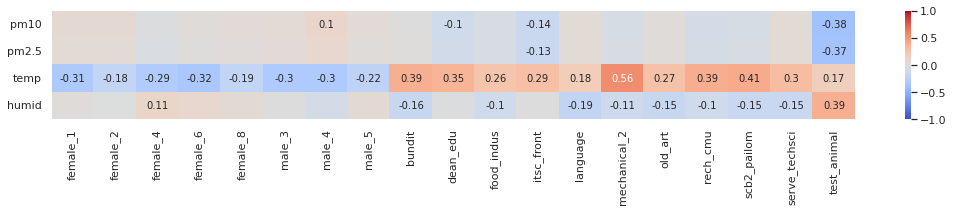

In [ ]:
corr_df = datasets.corr().iloc[:4, 4:]
plt.figure(figsize=(18,2))
ax = sns.heatmap(corr_df, vmin=-1, vmax=1,
                  cmap='coolwarm', fmt='.2f',annot=True)

for text in ax.texts:
    t = float(text.get_text())
    if -0.1 < t < 0.1:
        text.set_text('')
    else:
        text.set_text(round(t, 2))
plt.show()

## Cross Correlation (Energy VS Weather)

In [13]:
def crosscorr(datax, datay, lag=0):
  return datax.corr(datay.shift(lag))

def cross_corr_heatmap(df, title):
  corr_df = df.copy() 
  fig, ax = plt.subplots(figsize=(6,8))
  ax = sns.heatmap(corr_df, vmin=-1, vmax=1,
                    cmap='coolwarm',annot=True, linewidth=0.3, cbar=False)
  for text in ax.texts:
      t = float(text.get_text())
      if -0.1 < t < 0.1:
          text.set_text('')
      else:
          text.set_text(round(t, 2))
  ax.xaxis.set_tick_params(labelsize=13)
  ax.yaxis.set_tick_params(labelsize=13)
  ax.set_title('​Cross Correlation of ' + title , size=25)
  ax.set_xlabel('Lags', size=15)
  ax.set_ylabel('Weather & Electricity consumption', size=15)
  fig.tight_layout()
  plt.show()

In [6]:
total_corr= dict()
for weather in datasets.iloc[:,:4].columns:
    each_weather = []
    datax = datasets[weather]
    for meter in datasets.iloc[:, :].columns:
        datay = datasets[meter]
        each_building = [crosscorr(datax, datay, lag=i) for i in range(-4,5)]
        each_weather.append(each_building)
    total_corr[weather] = pd.DataFrame(each_weather, columns=np.arange(-4,5), index=datasets.iloc[:, :].columns)

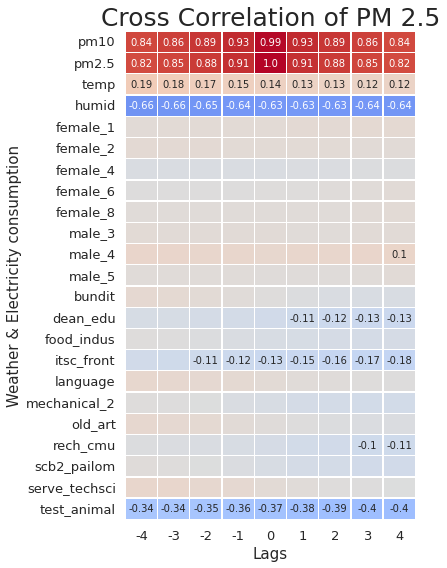

In [14]:
cross_corr_heatmap(total_corr['pm2.5'], title='PM 2.5')

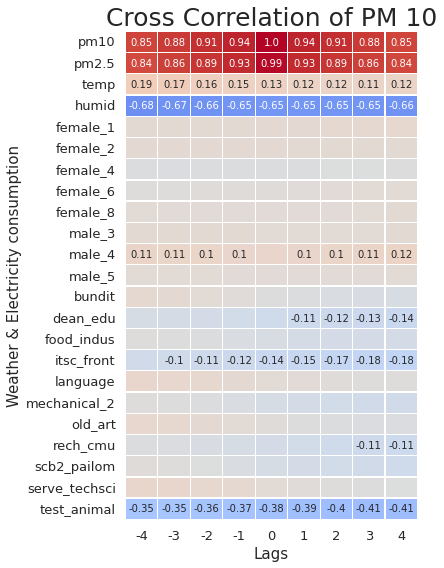

In [15]:
cross_corr_heatmap(total_corr['pm10'], title='PM 10')

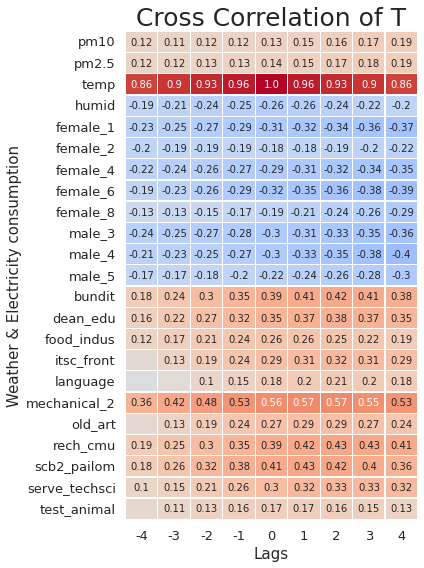

In [20]:
cross_corr_heatmap(total_corr['temp'], title='T')

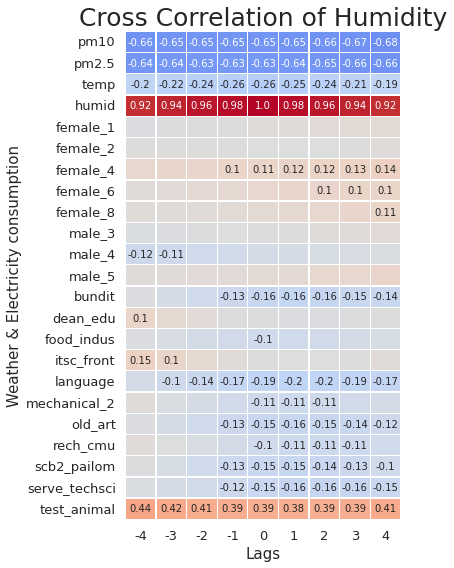

In [17]:
cross_corr_heatmap(total_corr['humid'], title='Humidity')

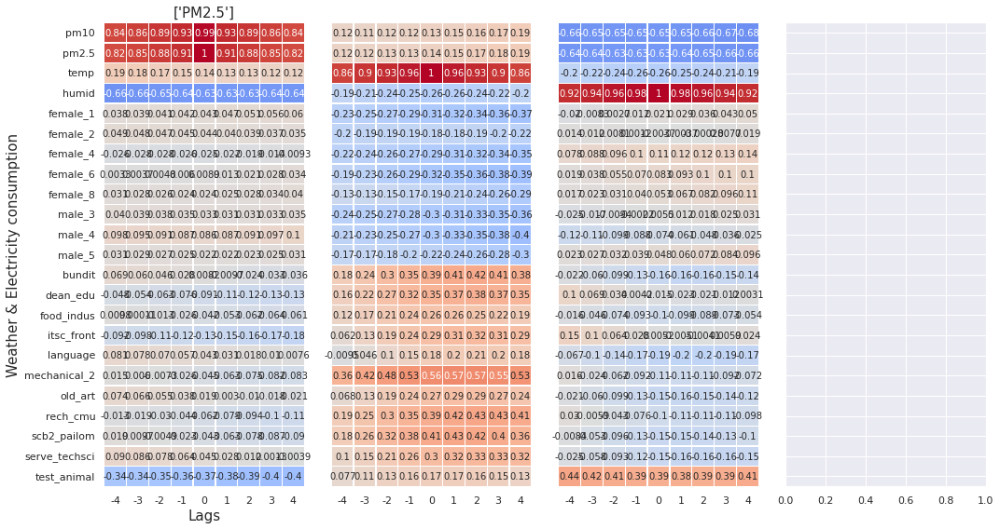

In [25]:
fig, ax = plt.subplots(4,1, figsize=(6,8), sharey=True)
sns.heatmap(total_corr['pm2.5'], vmin=-1, vmax=1,
                cmap='coolwarm',annot=True, linewidth=0.3, cbar=False, ax=ax[0]
            )
sns.heatmap(total_corr['temp'], vmin=-1, vmax=1,
                cmap='coolwarm',annot=True, linewidth=0.3, cbar=False, ax=ax[1]
            )
sns.heatmap(total_corr['humid'], vmin=-1, vmax=1,
                cmap='coolwarm',annot=True, linewidth=0.3, cbar=False, ax=ax[2]
            )
'''for text in ax.texts:
    t = float(text.get_text())
    if -0.1 < t < 0.1:
        text.set_text('')
    else:
        text.set_text(round(t, 2))'''
ax[0].set_title(['PM2.5'], size=15)
ax[0].set_xlabel('Lags', size=15)
ax[0].set_ylabel('Weather & Electricity consumption', size=15)
fig.tight_layout()
plt.show()